### Student Information
Name: Kseniia Sholokhova

Student ID: d610112006

GitHub ID: wen-shu-xia

---

### Instructions

1. First: do the **take home** exercises in the [DM2024-Lab1-Master](https://github.com/didiersalazar/DM2024-Lab1-Master.git). You may need to copy some cells from the Lab notebook to this notebook. __This part is worth 20% of your grade.__


2. Second: follow the same process from the [DM2024-Lab1-Master](https://github.com/didiersalazar/DM2024-Lab1-Master.git) on **the new dataset**. You don't need to explain all details as we did (some **minimal comments** explaining your code are useful though).  __This part is worth 30% of your grade.__
    - Download the [the new dataset](https://huggingface.co/datasets/Senem/Nostalgic_Sentiment_Analysis_of_YouTube_Comments_Data). The dataset contains a `sentiment` and `comment` columns, with the sentiment labels being: 'nostalgia' and 'not nostalgia'. Read the specificiations of the dataset for background details. 
    - You are allowed to use and modify the `helper` functions in the folder of the first lab session (notice they may need modification) or create your own.


3. Third: please attempt the following tasks on **the new dataset**. __This part is worth 30% of your grade.__
    - Generate meaningful **new data visualizations**. Refer to online resources and the Data Mining textbook for inspiration and ideas. 
    - Generate **TF-IDF features** from the tokens of each text. This will generating a document matrix, however, the weights will be computed differently (using the TF-IDF value of each word per document as opposed to the word frequency). Refer to this Scikit-learn [guide](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html) .
    - Implement a simple **Naive Bayes classifier** that automatically classifies the records into their categories. Use both the TF-IDF features and word frequency features to build two seperate classifiers. Note that for the TF-IDF features you might need to use other type of NB classifier different than the one in the Master Notebook. Comment on the differences.  Refer to this [article](https://hub.packtpub.com/implementing-3-naive-bayes-classifiers-in-scikit-learn/).


4. Fourth: In the lab, we applied each step really quickly just to illustrate how to work with your dataset. There are somethings that are not ideal or the most efficient/meaningful. Each dataset can be handled differently as well. What are those inefficent parts you noticed? How can you improve the Data preprocessing for these specific datasets? __This part is worth 10% of your grade.__


5. Fifth: It's hard for us to follow if your code is messy, so please **tidy up your notebook** and **add minimal comments where needed**. __This part is worth 10% of your grade.__


You can submit your homework following these guidelines: [Git Intro & How to hand your homework](https://github.com/didiersalazar/DM2024-Lab1-Master/blob/main/Git%20Intro%20%26%20How%20to%20hand%20your%20homework.ipynb). Make sure to commit and save your changes to your repository __BEFORE the deadline (October 27th 11:59 pm, Sunday)__. 

In [2]:
### Begin Assignment Here

## The first part of homework 

##### Supplementary code for copied from Master notebook, so that the all homework can be run here at once

In [1]:
# TEST necessary for when working with external scripts
%load_ext autoreload
%autoreload 2

In [2]:
# categories
categories = ['alt.atheism', 'soc.religion.christian', 'comp.graphics', 'sci.med']

In [3]:
# obtain the documents containing the categories provided
from sklearn.datasets import fetch_20newsgroups

twenty_train = fetch_20newsgroups(subset='train', categories=categories,
                                  shuffle=True, random_state=42) 
#This command also shuffles the data randomly, but with random_state we can bring the same distribution of data everytime 
#if we choose the same number, in this case "42". This is good for us, it means we can reproduce the same results every time
#we want to run the code.

In [4]:
twenty_train.data[0:2]

['From: sd345@city.ac.uk (Michael Collier)\nSubject: Converting images to HP LaserJet III?\nNntp-Posting-Host: hampton\nOrganization: The City University\nLines: 14\n\nDoes anyone know of a good way (standard PC application/PD utility) to\nconvert tif/img/tga files into LaserJet III format.  We would also like to\ndo the same, converting to HPGL (HP plotter) files.\n\nPlease email any response.\n\nIs this the correct group?\n\nThanks in advance.  Michael.\n-- \nMichael Collier (Programmer)                 The Computer Unit,\nEmail: M.P.Collier@uk.ac.city                The City University,\nTel: 071 477-8000 x3769                      London,\nFax: 071 477-8565                            EC1V 0HB.\n',
 "From: ani@ms.uky.edu (Aniruddha B. Deglurkar)\nSubject: help: Splitting a trimming region along a mesh \nOrganization: University Of Kentucky, Dept. of Math Sciences\nLines: 28\n\n\n\n\tHi,\n\n\tI have a problem, I hope some of the 'gurus' can help me solve.\n\n\tBackground of the probl

In [5]:
twenty_train.target_names
len(twenty_train.data)
len(twenty_train.filenames)

2257

In [6]:
# An example of what the subset contains
print("\n".join(twenty_train.data[0].split("\n")))

From: sd345@city.ac.uk (Michael Collier)
Subject: Converting images to HP LaserJet III?
Nntp-Posting-Host: hampton
Organization: The City University
Lines: 14

Does anyone know of a good way (standard PC application/PD utility) to
convert tif/img/tga files into LaserJet III format.  We would also like to
do the same, converting to HPGL (HP plotter) files.

Please email any response.

Is this the correct group?

Thanks in advance.  Michael.
-- 
Michael Collier (Programmer)                 The Computer Unit,
Email: M.P.Collier@uk.ac.city                The City University,
Tel: 071 477-8000 x3769                      London,
Fax: 071 477-8565                            EC1V 0HB.



In [7]:
print(twenty_train.target_names[twenty_train.target[0]])
twenty_train.target[0]

comp.graphics


1

In [8]:
# category of first 10 documents.
twenty_train.target[0:10]

array([1, 1, 3, 3, 3, 3, 3, 2, 2, 2], dtype=int64)

In [9]:
for t in twenty_train.target[:10]:
    print(twenty_train.target_names[t])

comp.graphics
comp.graphics
soc.religion.christian
soc.religion.christian
soc.religion.christian
soc.religion.christian
soc.religion.christian
sci.med
sci.med
sci.med


#### Exercise 1 - solution

In [10]:
for t in twenty_train.data[:3]:
    print(t)

From: sd345@city.ac.uk (Michael Collier)
Subject: Converting images to HP LaserJet III?
Nntp-Posting-Host: hampton
Organization: The City University
Lines: 14

Does anyone know of a good way (standard PC application/PD utility) to
convert tif/img/tga files into LaserJet III format.  We would also like to
do the same, converting to HPGL (HP plotter) files.

Please email any response.

Is this the correct group?

Thanks in advance.  Michael.
-- 
Michael Collier (Programmer)                 The Computer Unit,
Email: M.P.Collier@uk.ac.city                The City University,
Tel: 071 477-8000 x3769                      London,
Fax: 071 477-8565                            EC1V 0HB.

From: ani@ms.uky.edu (Aniruddha B. Deglurkar)
Subject: help: Splitting a trimming region along a mesh 
Organization: University Of Kentucky, Dept. of Math Sciences
Lines: 28



	Hi,

	I have a problem, I hope some of the 'gurus' can help me solve.

	Background of the problem:
	I have a rectangular mesh in the uv

##### Supplementary code for copied from Master notebook, so that the all homework can be run here at once

In [15]:
import pandas as pd
!pip install nltk
# my functions
import helpers.data_mining_helpers as dmh

# construct dataframe from a list
X = pd.DataFrame.from_records(dmh.format_rows(twenty_train), columns= ['text'])

In [16]:
len(X)
X[0:2]

,text
0,From: sd345@city.ac.uk (Michael Collier) Subje...
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...


In [17]:
for t in X["text"][:2]:
    print(t)

From: sd345@city.ac.uk (Michael Collier) Subject: Converting images to HP LaserJet III? Nntp-Posting-Host: hampton Organization: The City University Lines: 14  Does anyone know of a good way (standard PC application/PD utility) to convert tif/img/tga files into LaserJet III format.  We would also like to do the same, converting to HPGL (HP plotter) files.  Please email any response.  Is this the correct group?  Thanks in advance.  Michael. --  Michael Collier (Programmer)                 The Computer Unit, Email: M.P.Collier@uk.ac.city                The City University, Tel: 071 477-8000 x3769                      London, Fax: 071 477-8565                            EC1V 0HB. 
From: ani@ms.uky.edu (Aniruddha B. Deglurkar) Subject: help: Splitting a trimming region along a mesh  Organization: University Of Kentucky, Dept. of Math Sciences Lines: 28    	Hi,  	I have a problem, I hope some of the 'gurus' can help me solve.  	Background of the problem: 	I have a rectangular mesh in the uv

In [18]:
# add category to the dataframe
X['category'] = twenty_train.target

# add category label also
X['category_name'] = X.category.apply(lambda t: dmh.format_labels(t, twenty_train))

In [19]:
X[0:10]
# a simple query
X[:10][["text","category_name"]]

,text,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,comp.graphics
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,soc.religion.christian
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,soc.religion.christian
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,soc.religion.christian
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,sci.med
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,sci.med
9,From: libman@hsc.usc.edu (Marlena Libman) Subj...,sci.med


#### Exercise 2 - solution 

In [20]:
### practise accesing the category attribute
X.category

0       1
1       1
2       3
3       3
4       3
       ..
2252    2
2253    2
2254    2
2255    2
2256    2
Name: category, Length: 2257, dtype: int64

In [21]:
### practise accesing the attribute, where index is sorted
X.category.sort_index()

0       1
1       1
2       3
3       3
4       3
       ..
2252    2
2253    2
2254    2
2255    2
2256    2
Name: category, Length: 2257, dtype: int64

In [22]:
### quering the number of lines in a dataframe that hav.edu extension
### I was interested if i can query all of the text that comes from institutions organization
### I used apply and lambda for it, and to get a count number function sum

education_source = X['text'].apply(lambda x: ".edu" in x)
education_source.sum()

1586

#### Exercise 3 - solution

In [23]:
print(X[X['category_name']=='sci.med'].iloc[::10][0:5])

                                                  text  category category_name
7    From: aldridge@netcom.com (Jacquelin Aldridge)...         2       sci.med
49   From: jimj@contractor.EBay.Sun.COM (Jim Jones)...         2       sci.med
82   From: jason@ab20.larc.nasa.gov (Jason Austin) ...         2       sci.med
118  From: rogers@calamari.hi.com (Andrew Rogers) S...         2       sci.med
142  From: lady@uhunix.uhcc.Hawaii.Edu (Lee Lady) S...         2       sci.med


##### Supplementary code for copied from Master notebook, so that the all homework can be run here at once

In [24]:
# check missing values
X.isnull()

,text,category,category_name
0,False,False,False
1,False,False,False
2,False,False,False
3,False,False,False
4,False,False,False
...,...,...,...
2252,False,False,False
2253,False,False,False
2254,False,False,False
2255,False,False,False


In [25]:
X.isnull().apply(lambda x: dmh.check_missing_values(x))

,text,category,category_name
0,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:
1,0,0,0


#### Exercise 4 - solution

In [26]:
X.isnull().apply(lambda x: dmh.check_missing_values(x), axis =1)

0       (The amoung of missing records is: , 0)
1       (The amoung of missing records is: , 0)
2       (The amoung of missing records is: , 0)
3       (The amoung of missing records is: , 0)
4       (The amoung of missing records is: , 0)
                         ...                   
2252    (The amoung of missing records is: , 0)
2253    (The amoung of missing records is: , 0)
2254    (The amoung of missing records is: , 0)
2255    (The amoung of missing records is: , 0)
2256    (The amoung of missing records is: , 0)
Length: 2257, dtype: object

##### Supplementary code for copied from Master notebook, so that the all homework can be run here at once

In [ ]:
dummy_series = pd.Series(["dummy_record", 1], index=["text", "category"])

In [ ]:
dummy_series.to_frame().T
# .to_frame() -> Convert Series to DataFrame
# .T          -> Transpose

In [ ]:
result_with_series = pd.concat([X, dummy_series.to_frame().T], ignore_index=True)

In [ ]:
# check if the records was commited into result
len(result_with_series)

In [ ]:
result_with_series.isnull().apply(lambda x: dmh.check_missing_values(x))

In [ ]:
# dummy record as dictionary format
dummy_dict = [{'text': 'dummy_record',
               'category': 1
              }]

In [ ]:
X = pd.concat([X, pd.DataFrame(dummy_dict)], ignore_index=True)

In [ ]:
len(X)

In [ ]:
X.isnull().apply(lambda x: dmh.check_missing_values(x))

In [ ]:
X.dropna(inplace=True)

In [ ]:
X.isnull().apply(lambda x: dmh.check_missing_values(x))

#### Exercise 5 - solution

In [27]:
import numpy as np

NA_dict = [{ 'id': 'A', 'missing_example': np.nan },
           { 'id': 'B'                    },
           { 'id': 'C', 'missing_example': 'NaN'  },
           { 'id': 'D', 'missing_example': 'None' },
           { 'id': 'E', 'missing_example':  None  },
           { 'id': 'F', 'missing_example': ''     }]

NA_df = pd.DataFrame(NA_dict, columns = ['id','missing_example'])
NA_df

,id,missing_example
0,A,NaN
1,B,NaN
2,C,NaN
3,D,None
4,E,None
5,F,


In [28]:
NA_df['missing_example'].isnull()

0     True
1     True
2    False
3    False
4     True
5    False
Name: missing_example, dtype: bool

### Answer here
because they are not missing, as 'Nan', 'None' and '' has a text value. Python is treating the words in brackets as the strings,
hence these are not missing by isnull () function

##### Supplementary code for copied from Master notebook, so that the all homework can be run here at once

In [31]:
X.duplicated()
sum(X.duplicated())

0

In [32]:
dummy_duplicate_dict = [{
                             'text': 'dummy record',
                             'category': 1, 
                             'category_name': "dummy category"
                        },
                        {
                             'text': 'dummy record',
                             'category': 1, 
                             'category_name': "dummy category"
                        }]

In [33]:
X = pd.concat([X, pd.DataFrame(dummy_duplicate_dict)], ignore_index=True)

In [34]:
X.drop_duplicates(keep=False, inplace=True) # inplace applies changes directly on our dataframe

In [35]:
X_sample = X.sample(n=1000) #random state
len(X_sample)

1000

In [36]:
X_sample[0:4]

,text,category,category_name
1494,From: whitsebd@nextwork.rose-hulman.edu (Bryan...,3,soc.religion.christian
1623,From: marcbg@feenix.metronet.com (Marc Grant) ...,2,sci.med
961,From: Donald Mackie <Donald_Mackie@med.umich.e...,2,sci.med
1696,From: jaeger@buphy.bu.edu (Gregg Jaeger) Subje...,0,alt.atheism


#### Exercise 6 - solution

In [37]:
X

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian
...,...,...,...
2252,From: roos@Operoni.Helsinki.FI (Christophe Roo...,2,sci.med
2253,From: mhollowa@ic.sunysb.edu (Michael Holloway...,2,sci.med
2254,From: sasghm@theseus.unx.sas.com (Gary Merrill...,2,sci.med
2255,From: Dan Wallach <dwallach@cs.berkeley.edu> S...,2,sci.med


In [38]:
X_sample

,text,category,category_name
1494,From: whitsebd@nextwork.rose-hulman.edu (Bryan...,3,soc.religion.christian
1623,From: marcbg@feenix.metronet.com (Marc Grant) ...,2,sci.med
961,From: Donald Mackie <Donald_Mackie@med.umich.e...,2,sci.med
1696,From: jaeger@buphy.bu.edu (Gregg Jaeger) Subje...,0,alt.atheism
1075,From: mprc@troi.cc.rochester.edu (M. Price) Su...,3,soc.religion.christian
...,...,...,...
1039,From: euclid@mrcnext.cso.uiuc.edu (Euclid K.) ...,2,sci.med
2181,From: phs431d@vaxc.cc.monash.edu.au Subject: R...,3,soc.religion.christian
571,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med
1536,From: tedr@athena.cs.uga.edu (Ted Kalivoda) Su...,3,soc.religion.christian


### Answer here
after printing two dataframes, i noticed several things:
##### a- In the original(X) dataframe, the records are ordered from 0 to 2256 numerically, however in X_sample they look not ordered, like random selection
##### b- The data size of original(X) dataframe also was reduced to 1000 rows after we applied .sample 

##### Supplementary code for copied from Master notebook, so that the all homework can be run here at once

In [40]:
import matplotlib.pyplot as plt
%matplotlib inline

In [41]:
categories

['alt.atheism', 'soc.religion.christian', 'comp.graphics', 'sci.med']

soc.religion.christian    599
sci.med                   594
comp.graphics             584
alt.atheism               480
Name: category_name, dtype: int64


<AxesSubplot:title={'center':'Category distribution'}>

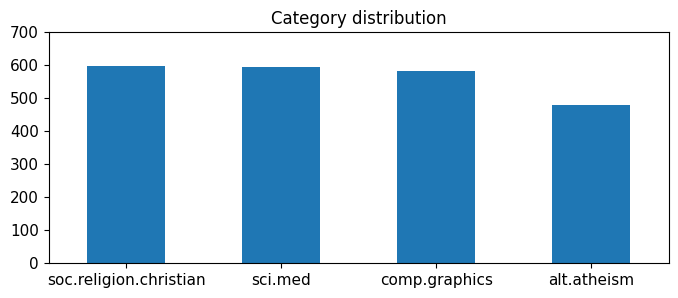

In [42]:
print(X.category_name.value_counts())

# plot barchart for X
X.category_name.value_counts().plot(kind = 'bar',
                                    title = 'Category distribution',
                                    ylim = [0, 700],        
                                    rot = 0, fontsize = 11, figsize = (8,3))

soc.religion.christian    271
sci.med                   270
comp.graphics             252
alt.atheism               207
Name: category_name, dtype: int64


<AxesSubplot:title={'center':'Category distribution'}>

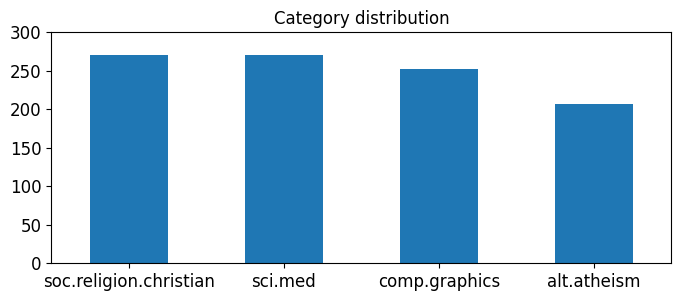

In [43]:
print(X_sample.category_name.value_counts())

# plot barchart for X_sample
X_sample.category_name.value_counts().plot(kind = 'bar',
                                           title = 'Category distribution',
                                           ylim = [0, 300], 
                                           rot = 0, fontsize = 12, figsize = (8,3))

#### Exercise 7 - solution

soc.religion.christian    271
sci.med                   270
comp.graphics             252
alt.atheism               207
Name: category_name, dtype: int64


<AxesSubplot:title={'center':'Category distribution'}>

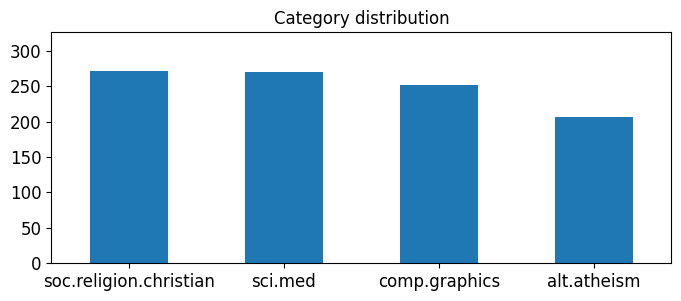

In [44]:
upper_bound = max(X_sample.category_name.value_counts() + 55)
print(X_sample.category_name.value_counts())

# plot barchart for X_sample
X_sample.category_name.value_counts().plot(kind = 'bar',
                                           title = 'Category distribution',
                                           ylim = [0, upper_bound], 
                                           rot = 0, fontsize = 12, figsize = (8,3))

#### Exercise 8 - solution

<AxesSubplot:title={'center':'Category distribution'}>

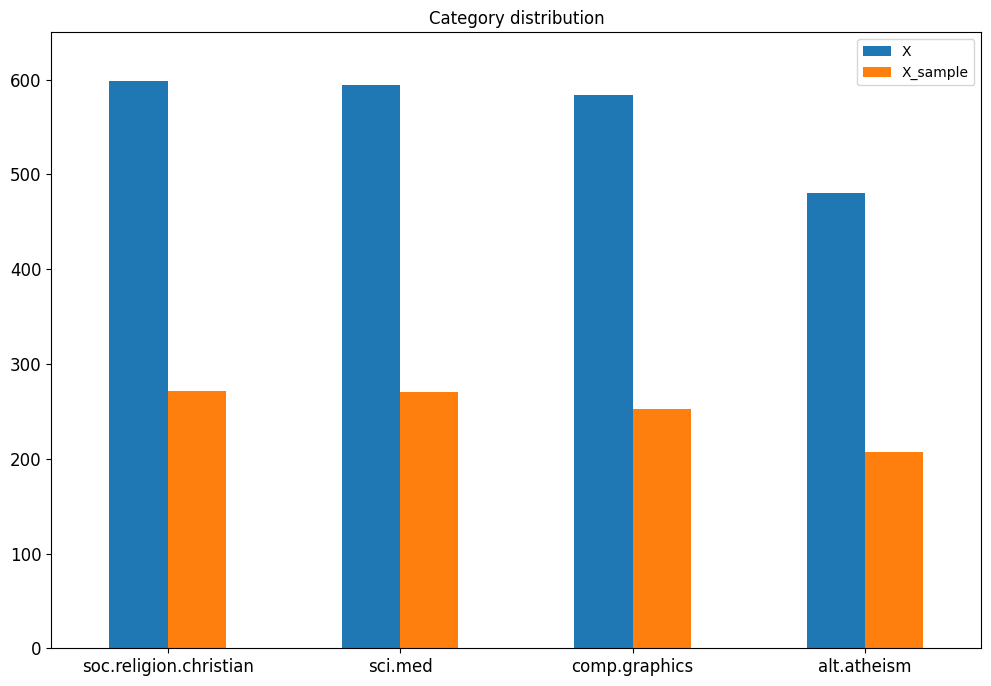

In [45]:
X_categories = X['category_name'].value_counts()
X_sample_categories = X_sample['category_name'].value_counts()

combined_df = pd.DataFrame({'X': X_categories,'X_sample': X_sample_categories}) 

combined_df.plot(kind = 'bar',
                 title = 'Category distribution',
                 ylim = [0, 650], 
                 rot = 0, fontsize = 12, figsize = (12,8))

##### Supplementary code for copied from Master notebook, so that the all homework can be run here at once

In [46]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\JennisH\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [47]:
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\JennisH\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [48]:
# takes a like a minute or two to process
X['unigrams'] = X['text'].apply(lambda x: dmh.tokenize_text(x))

In [49]:
X[0:4]["unigrams"]

0    [From, :, sd345, @, city.ac.uk, (, Michael, Co...
1    [From, :, ani, @, ms.uky.edu, (, Aniruddha, B....
2    [From, :, djohnson, @, cs.ucsd.edu, (, Darin, ...
3    [From, :, s0612596, @, let.rug.nl, (, M.M, ., ...
Name: unigrams, dtype: object

In [50]:
X[0:4]

,text,category,category_name,unigrams
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,"[From, :, sd345, @, city.ac.uk, (, Michael, Co..."
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics,"[From, :, ani, @, ms.uky.edu, (, Aniruddha, B...."
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,"[From, :, djohnson, @, cs.ucsd.edu, (, Darin, ..."
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,"[From, :, s0612596, @, let.rug.nl, (, M.M, ., ..."


In [51]:
list(X[0:1]['unigrams'])

[['From',
  ':',
  'sd345',
  '@',
  'city.ac.uk',
  '(',
  'Michael',
  'Collier',
  ')',
  'Subject',
  ':',
  'Converting',
  'images',
  'to',
  'HP',
  'LaserJet',
  'III',
  '?',
  'Nntp-Posting-Host',
  ':',
  'hampton',
  'Organization',
  ':',
  'The',
  'City',
  'University',
  'Lines',
  ':',
  '14',
  'Does',
  'anyone',
  'know',
  'of',
  'a',
  'good',
  'way',
  '(',
  'standard',
  'PC',
  'application/PD',
  'utility',
  ')',
  'to',
  'convert',
  'tif/img/tga',
  'files',
  'into',
  'LaserJet',
  'III',
  'format',
  '.',
  'We',
  'would',
  'also',
  'like',
  'to',
  'do',
  'the',
  'same',
  ',',
  'converting',
  'to',
  'HPGL',
  '(',
  'HP',
  'plotter',
  ')',
  'files',
  '.',
  'Please',
  'email',
  'any',
  'response',
  '.',
  'Is',
  'this',
  'the',
  'correct',
  'group',
  '?',
  'Thanks',
  'in',
  'advance',
  '.',
  'Michael',
  '.',
  '--',
  'Michael',
  'Collier',
  '(',
  'Programmer',
  ')',
  'The',
  'Computer',
  'Unit',
  ',',
  'Emai

In [52]:
from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer()
X_counts = count_vect.fit_transform(X.text) #learn the vocabulary and return document-term matrix
print(X_counts[0])

  (0, 14887)	1
  (0, 29022)	1
  (0, 8696)	4
  (0, 4017)	2
  (0, 33256)	2
  (0, 21661)	3
  (0, 9031)	3
  (0, 31077)	1
  (0, 9805)	2
  (0, 17366)	1
  (0, 32493)	4
  (0, 16916)	2
  (0, 19780)	2
  (0, 17302)	2
  (0, 23122)	1
  (0, 25663)	1
  (0, 16881)	1
  (0, 16082)	1
  (0, 23915)	1
  (0, 32142)	5
  (0, 33597)	2
  (0, 20253)	1
  (0, 587)	1
  (0, 12051)	1
  (0, 5201)	1
  :	:
  (0, 25361)	1
  (0, 25337)	1
  (0, 12833)	2
  (0, 5195)	1
  (0, 27836)	1
  (0, 18474)	1
  (0, 32270)	1
  (0, 9932)	1
  (0, 15837)	1
  (0, 32135)	1
  (0, 17556)	1
  (0, 4378)	1
  (0, 26175)	1
  (0, 9338)	1
  (0, 33572)	1
  (0, 31915)	1
  (0, 177)	2
  (0, 2326)	2
  (0, 3062)	1
  (0, 35416)	1
  (0, 20459)	1
  (0, 14085)	1
  (0, 3166)	1
  (0, 12541)	1
  (0, 230)	1


In [53]:
count_vect.get_feature_names_out()[14887]

'from'

In [54]:
analyze = count_vect.build_analyzer()
analyze("I am craving for a hawaiian pizza right now")

# tokenization, remove stop words (e.g i, a, the), create n-gram (or unigram)

['am', 'craving', 'for', 'hawaiian', 'pizza', 'right', 'now']

#### Exercise 9 - solution

In [55]:
analyze(X.text[0])

['from',
 'sd345',
 'city',
 'ac',
 'uk',
 'michael',
 'collier',
 'subject',
 'converting',
 'images',
 'to',
 'hp',
 'laserjet',
 'iii',
 'nntp',
 'posting',
 'host',
 'hampton',
 'organization',
 'the',
 'city',
 'university',
 'lines',
 '14',
 'does',
 'anyone',
 'know',
 'of',
 'good',
 'way',
 'standard',
 'pc',
 'application',
 'pd',
 'utility',
 'to',
 'convert',
 'tif',
 'img',
 'tga',
 'files',
 'into',
 'laserjet',
 'iii',
 'format',
 'we',
 'would',
 'also',
 'like',
 'to',
 'do',
 'the',
 'same',
 'converting',
 'to',
 'hpgl',
 'hp',
 'plotter',
 'files',
 'please',
 'email',
 'any',
 'response',
 'is',
 'this',
 'the',
 'correct',
 'group',
 'thanks',
 'in',
 'advance',
 'michael',
 'michael',
 'collier',
 'programmer',
 'the',
 'computer',
 'unit',
 'email',
 'collier',
 'uk',
 'ac',
 'city',
 'the',
 'city',
 'university',
 'tel',
 '071',
 '477',
 '8000',
 'x3769',
 'london',
 'fax',
 '071',
 '477',
 '8565',
 'ec1v',
 '0hb']

##### Supplementary code for copied from Master notebook, so that the all homework can be run here at once

In [56]:
# We can check the shape of this matrix by:
X_counts.shape

(2257, 35788)

In [57]:
# We can obtain the feature names of the vectorizer, i.e., the terms
# usually on the horizontal axis
count_vect.get_feature_names_out()[0:10]

array(['00', '000', '0000', '0000001200', '000005102000', '0001',
       '000100255pixel', '00014', '000406', '0007'], dtype=object)

In [58]:
# we convert from sparse array to normal array
X_counts[0:5, 0:100].toarray()

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0,

In [59]:
count_vect.get_feature_names_out()[0:1]

array(['00'], dtype=object)

#### Exercise 10 - solution

In [60]:
X_counts[0:5, 0:100].toarray()

for i, z in enumerate(X_counts[0:5, 0:100].toarray()):
    for j, value in enumerate(z):
        if value == 1:
            print(count_vect.get_feature_names_out()[j])

00
01


##### Supplementary code for copied from Master notebook, so that the all homework can be run here at once

In [61]:
X_counts[0:5, 0:100].toarray()

for i, z in enumerate(X_counts[0:5, 0:100].toarray()):
    for j, value in enumerate(z):
        if value == 1:
            print(count_vect.get_feature_names_out()[j])

00
01


In [62]:
# first twenty features only
plot_x = ["term_"+str(i) for i in count_vect.get_feature_names_out()[0:20]]

In [63]:
# obtain document index
plot_y = ["doc_"+ str(i) for i in list(X.index)[0:20]]

In [64]:
plot_z = X_counts[0:20, 0:20].toarray() #X_counts[how many documents, how many terms]
plot_z

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0,

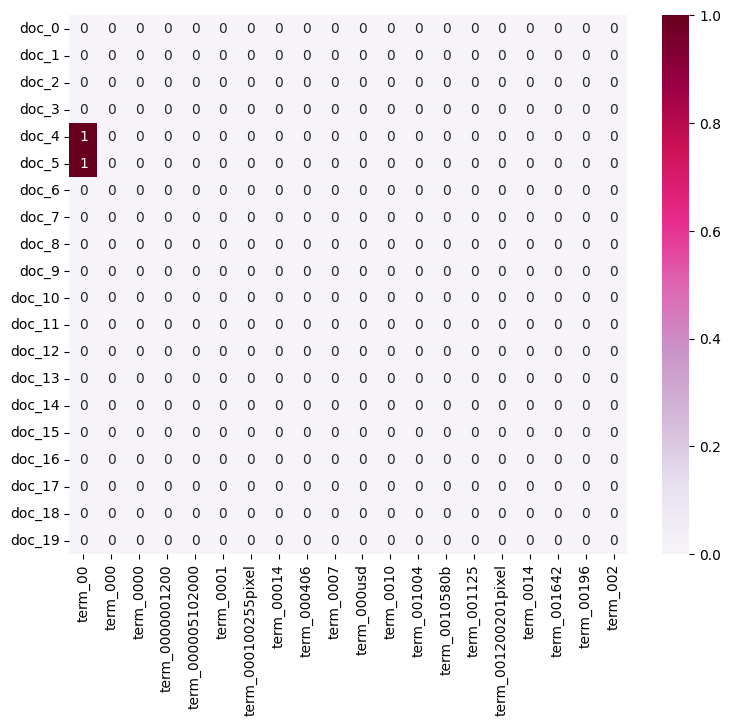

In [65]:
import seaborn as sns

df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(9, 7))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=1, annot=True)

#### Exercise 11 - solution

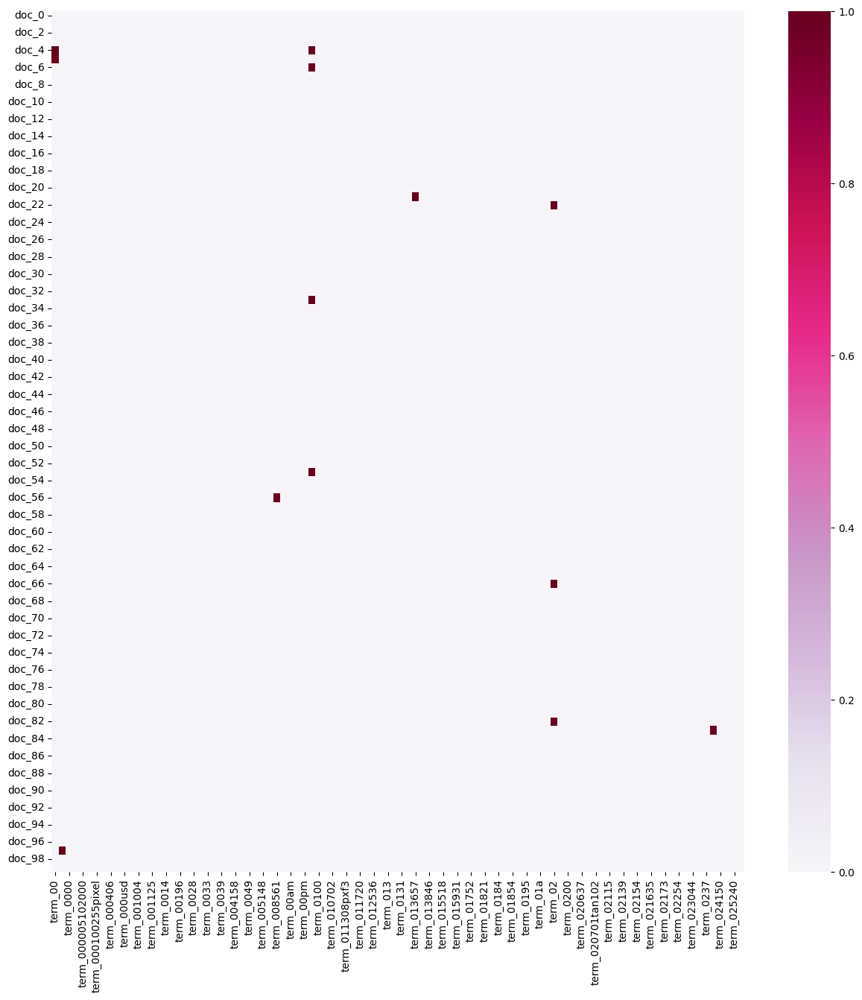

In [66]:
#firstly, I would try manually to increase the number of documents and see what it gives back

plot_x = ["term_"+str(i) for i in count_vect.get_feature_names_out()[0:100]]
plot_y = ["doc_"+ str(i) for i in list(X.index)[0:100]]
plot_z = X_counts[0:100, 0:100].toarray() 

#plotting more documents n=100 and more terms m=100

import seaborn as sns

df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(15, 15))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=1, annot=False)

(2257, 35788)


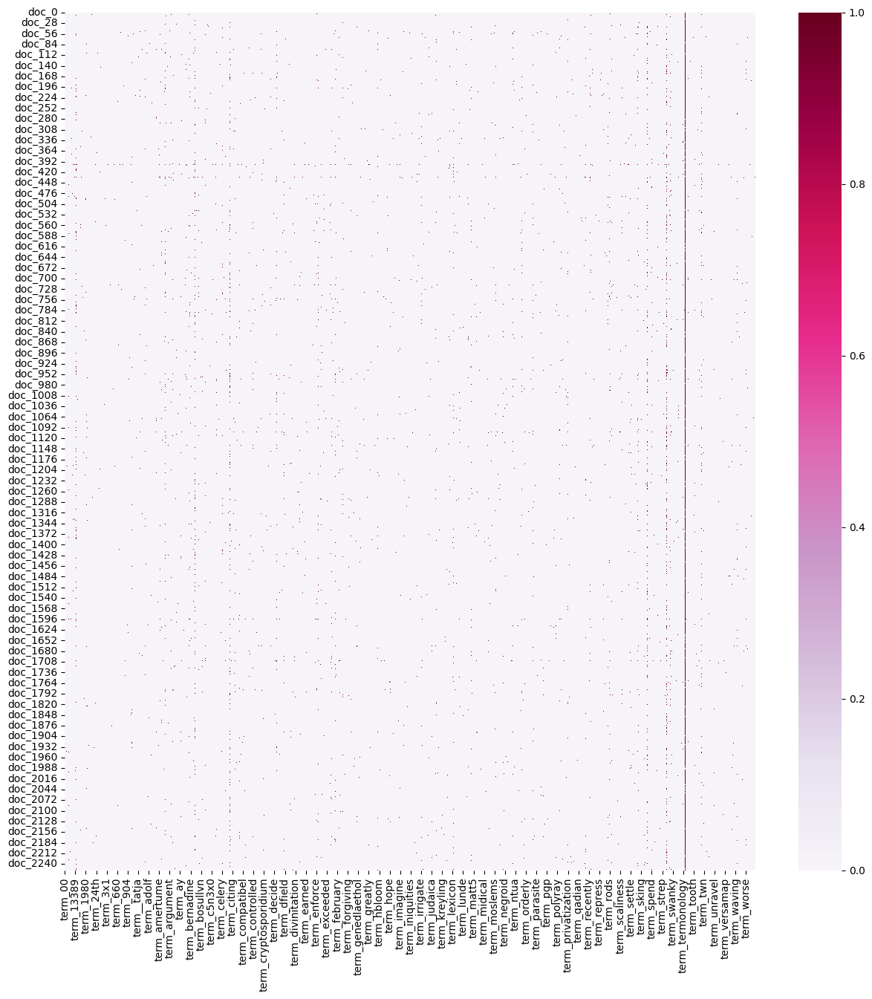

In [67]:
#then, I will see how much I can increase it in order to still see good visualization
plot_x = ["term_"+str(i) for i in count_vect.get_feature_names_out()]
plot_y = ["doc_"+ str(i) for i in list(X.index)]
plot_z = X_counts.toarray() 

#what is the final size of plot_z
print(plot_z.shape)

#2257 documents and 35788 terms?
#try to plot it all

import seaborn as sns

df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(15, 15))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=1, annot=False)

# seems something is off, but I can not tell exactly what
# my assumption would be that this heatmap wants to show me the most frequent terms across all of the documents
# this heatmap starts to remind a scatterplot

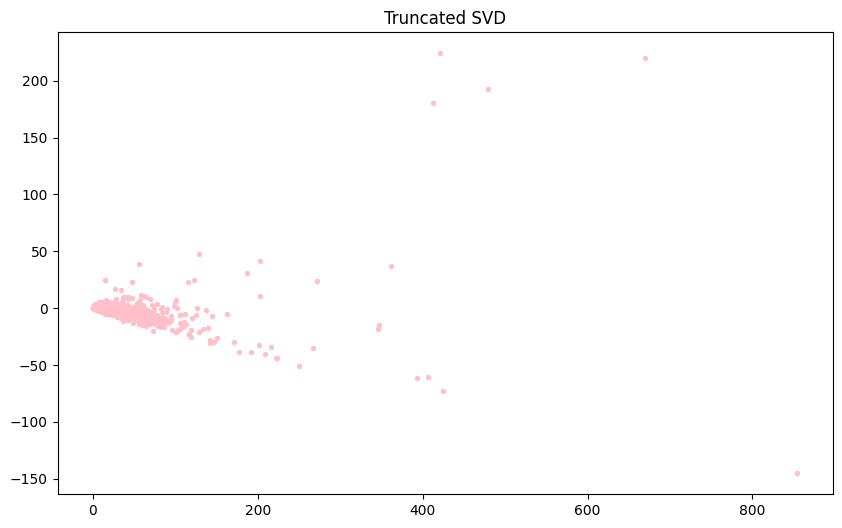

In [68]:
#as a big histogram reminds a scatterplot, I can try to plot it in this way and see what it does
# I tried and it takes a million years to compute and does not give much insights
# the matrix is too sparse and only 1 or 0 option
# maybe reduce dimensions, I checked on the internet that TruncatedSVD could be helpful for sparse matrix

from sklearn.decomposition import TruncatedSVD

svd = TruncatedSVD(n_components=2, random_state=42)
new_plot_z = svd.fit_transform(plot_z)

plt.figure(figsize=(10, 6))

plt.scatter(new_plot_z[:, 0], new_plot_z[:, 1], c='pink', s=8, edgecolor=None)

plt.title('Truncated SVD')
plt.show()

# as i understood here, each dot is a representation of how one document looks in two dimensional space
# it looks, visually, that there is some similarity between most of the documents
# however some of the documents are really different from the major cluster

#I think for further more informative visualization we can firstly extract our terms of interests and
#see for example how often they occur in different documents, or with what other terms most freq terms are associated,
#or what are the most frequent terms within the different category names

##### Supplementary code for copied from Master notebook, so that the all homework can be run here at once

In [69]:
# note this takes time to compute. You may want to reduce the amount of terms you want to compute frequencies for
term_frequencies = []
for j in range(0,X_counts.shape[1]):
    term_frequencies.append(sum(X_counts[:,j].toarray()))

#[3, 8, 5, 2, 5, 8, 2, 5, 3, 2]

In [70]:
term_frequencies = np.asarray(X_counts.sum(axis=0))[0]

In [71]:
term_frequencies[0] #sum of first term: 00

134

C:\Users\JennisH\AppData\Local\Temp\ipykernel_14852\3480579971.py:4: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.set_xticklabels(count_vect.get_feature_names_out()[:300], rotation = 90);


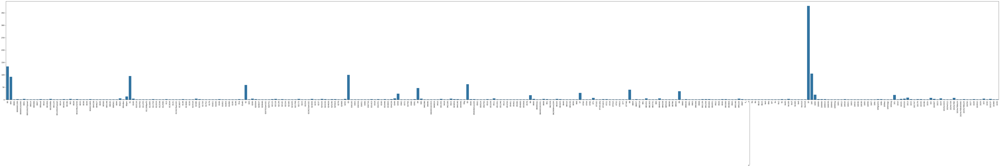

In [72]:
plt.subplots(figsize=(100, 10))
g = sns.barplot(x=count_vect.get_feature_names_out()[:300], 
            y=term_frequencies[:300])
g.set_xticklabels(count_vect.get_feature_names_out()[:300], rotation = 90);

#### Exercise 12 - solution

In [73]:
#using plotly
import plotly.express as px

# seems like we need to create a df first for using plotly
x = count_vect.get_feature_names_out()[:300]
y = term_frequencies[:300]

df = pd.DataFrame(x,y)

fig = px.bar(df,x,y)

fig.show()

#### Exercise 13

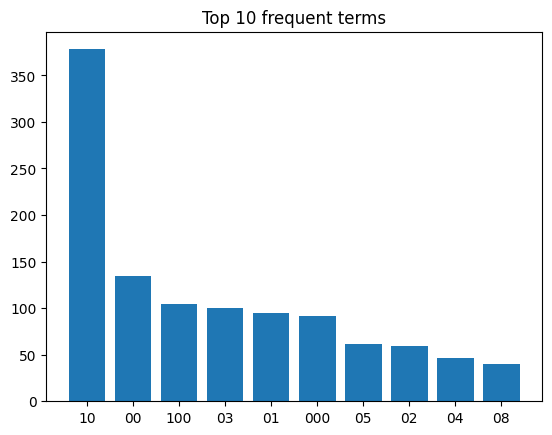

In [74]:
# more efficient might be to plot top 10 frequent terms

x = count_vect.get_feature_names_out()[:300]
y = term_frequencies[:300]

df = pd.DataFrame({'Term': x,'Frequency': y})

df_new = df.sort_values(by="Frequency", ascending=False)

df_new = df_new.head(10)

plt.bar(df_new['Term'], df_new['Frequency']) 

plt.title("Top 10 frequent terms")
plt.show()

#### Exercise 14

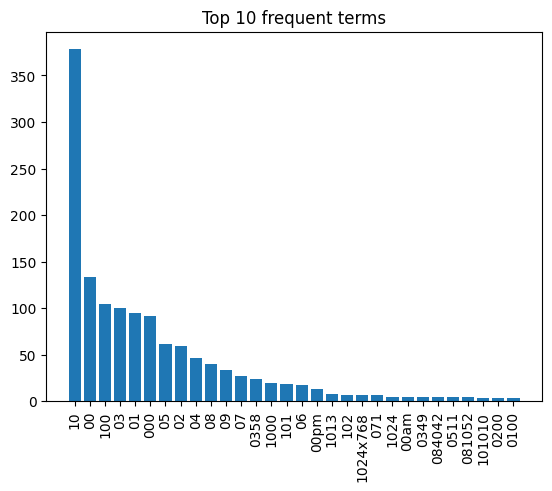

In [75]:
# might need top 30 for seeing a longer tail

x = count_vect.get_feature_names_out()[:300]
y = term_frequencies[:300]

df = pd.DataFrame({'Term': x,'Frequency': y})

df_new = df.sort_values(by="Frequency", ascending=False)

df_new = df_new.head(30)

plt.bar(df_new['Term'], df_new['Frequency']) 

#because now is more than 10, we need to rotate ticks for a better graph
plt.xticks(rotation=90)

plt.title("Top 10 frequent terms")
plt.show()

##### Supplementary code for copied from Master notebook, so that the all homework can be run here at once

In [76]:
import math
term_frequencies_log = [math.log(i) for i in term_frequencies]

C:\Users\JennisH\AppData\Local\Temp\ipykernel_14852\2166548998.py:4: UserWarning:

FixedFormatter should only be used together with FixedLocator



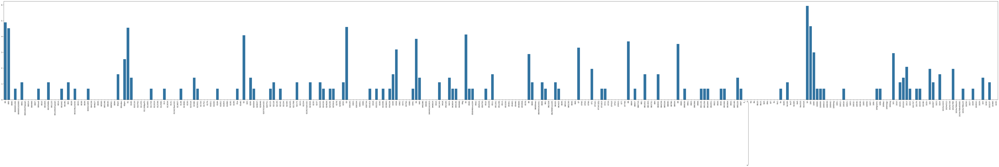

In [77]:
plt.subplots(figsize=(100, 10))
g = sns.barplot(x=count_vect.get_feature_names_out()[:300],
                y=term_frequencies_log[:300])
g.set_xticklabels(count_vect.get_feature_names_out()[:300], rotation = 90);

#### Exercise 15

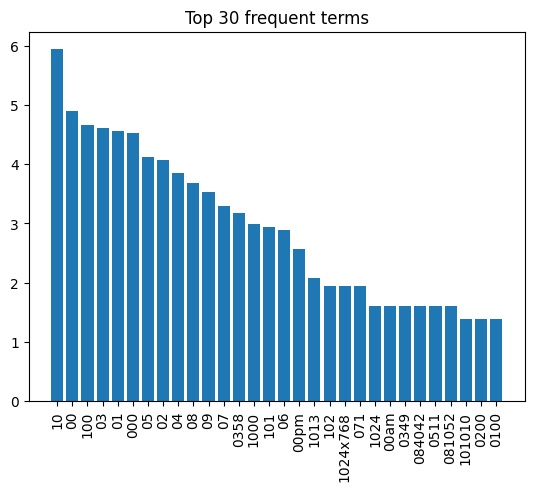

In [78]:
# change to term_frequencies_log

x = count_vect.get_feature_names_out()[:300]
y = term_frequencies_log[:300]

df = pd.DataFrame({'Term': x,'Frequency': y})

df_new = df.sort_values(by="Frequency", ascending=False)

df_new = df_new.head(30)

plt.bar(df_new['Term'], df_new['Frequency']) 

#because now is more than 10, we need to rotate ticks for a better graph
plt.xticks(rotation=90)

plt.title("Top 30 frequent terms")
plt.show()

### insights after comparing different plots

##### 1 - the scale has changed, when we applied log, the scale became bigger, which in turn, had made the difference between most frequent terms and less frequent terms visually less
##### 2 - also the long tail had disappered

##### Supplementary code for copied from Master notebook, so that the all homework can be run here at once


In [79]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

#Create separate DataFrames for each category
categories = X['category_name'].unique()  # Get unique category labels
category_dfs = {}  # Dictionary to store DataFrames for each category

for category in categories:
    # Filter the original DataFrame by category
    category_dfs[category] = X[X['category_name'] == category].copy()

# Function to create term-document frequency DataFrame for each category
def create_term_document_df(df):
    count_vect = CountVectorizer()  # Initialize the CountVectorizer
    X_counts = count_vect.fit_transform(df['text'])  # Transform the text data into word counts
    
    # Get the unique words (vocabulary) from the vectorizer
    words = count_vect.get_feature_names_out()
    
    # Create a DataFrame where rows are documents and columns are words
    term_document_df = pd.DataFrame(X_counts.toarray(), columns=words)
    
    return term_document_df

# Create term-document frequency DataFrames for each category
filt_term_document_dfs = {}  # Dictionary to store term-document DataFrames for each category

for category in categories:
    filt_term_document_dfs[category] = create_term_document_df(category_dfs[category])

In [80]:
# Display the filtered DataFrame for one of the categories, feel free to change the number in the vector
category_number=0 #You can change it from 0 to 3
print(f"Filtered Term-Document Frequency DataFrame for Category {categories[category_number]}:")
filt_term_document_dfs[categories[category_number]]

Filtered Term-Document Frequency DataFrame for Category comp.graphics:


,00,000,000005102000,000100255pixel,0007,000usd,0010580b,001200201pixel,00196,002,...,zorn,zrz,zsoft,zt,zug,zurich,zvi,zyeh,zyxel,ªl
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
579,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
580,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
581,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
582,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


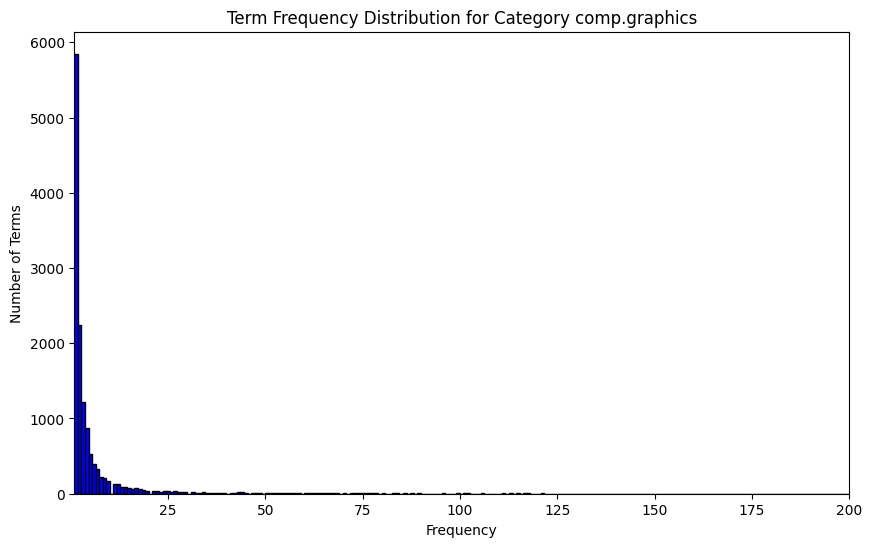

In [81]:
 # Sum over all documents to get total frequency for each word
category_number=0 #You can change it from 0 to 3
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()
 
# Visualize the frequency distribution
plt.figure(figsize=(10, 6))
plt.hist(word_counts, bins=5000, color='blue', edgecolor='black')
plt.title(f'Term Frequency Distribution for Category {categories[category_number]}')
plt.xlabel('Frequency')
plt.ylabel('Number of Terms')
plt.xlim(1, 200)
plt.show()

In [82]:
category_number=3 #You can change it from 0 to 3
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()

# Sort the term frequencies in descending order
sorted_indices = np.argsort(word_counts)[::-1]  # Get indices of sorted frequencies
sorted_counts = np.sort(word_counts)[::-1]  # Sort frequencies in descending order

# Calculate the index corresponding to the top 5% most frequent terms
total_terms = len(sorted_counts)
top_5_percent_index = int(0.05 * total_terms)

# Get the indices of the top 5% most frequent terms
top_5_percent_indices = sorted_indices[:top_5_percent_index]

# Filter terms that belong to the top 5% based on their rank
filtered_words = [filt_term_document_dfs[categories[category_number]].iloc[:, i].name for i in top_5_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in top 5%: {top_5_percent_index}")
print(f"Filtered terms: {filtered_words}")


Category: alt.atheism
Number of terms in top 5%: 598
Filtered terms: ['the', 'of', 'to', 'is', 'that', 'and', 'in', 'it', 'you', 'not', 'be', 'are', 'this', 'edu', 'for', 'have', 'from', 'as', 'but', 'or', 'if', 'on', 'was', 'an', 'what', 'they', 'god', 'we', 'by', 'one', 'with', 're', 'can', 'there', 'do', 'so', 'your', 'he', 'people', 'writes', 'no', 'com', 'all', 'subject', 'about', 'lines', 'would', 'who', 'at', 'some', 'don', 'organization', 'my', 'will', 'article', 'which', 'think', 'has', 'more', 'any', 'their', 'then', 'keith', 'than', 'his', 'does', 'me', 'say', 'how', 'atheists', 'posting', 'atheism', 'other', 'just', 'when', 'only', 'were', 'because', 'like', 'know', 'them', 'been', 'many', 'why', 'out', 'believe', 'being', 'such', 'well', 'nntp', 'even', 'host', 'see', 'could', 'religion', 'up', 'time', 'must', 'said', 'caltech', 'system', 'should', 'jesus', 'islam', 'evidence', 'something', 'us', 'way', 'here', 'morality', 'those', 'things', 'university', 'good', 'argument

In [83]:
sorted_counts #We can see the frequencies sorted in a descending order

array([7234, 4253, 4249, ...,    1,    1,    1], dtype=int64)

In [84]:
sorted_indices #This are the indices corresponding to the words after being sorted in a descending order

array([10808,  7810, 10946, ...,  3856,  8350, 11966], dtype=int64)

In [85]:
filt_term_document_dfs[categories[category_number]].loc[:,'the'].sum(axis=0) #Here we can sum up the column corresponding to the top 5% words, we just specify which one first.

7234

In [86]:
category_number=3 #You can change it from 0 to 3
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()

# Sort the term frequencies in ascending order and get sorted indices
sorted_indices = np.argsort(word_counts)  # Get indices of sorted frequencies
sorted_counts = word_counts[sorted_indices]  # Sort frequencies

# Calculate the index corresponding to the bottom 1% least frequent terms
total_terms = len(sorted_counts)
bottom_1_percent_index = int(0.01 * total_terms)

# Get the indices of the bottom 1% least frequent terms
bottom_1_percent_indices = sorted_indices[:bottom_1_percent_index]

# Filter terms that belong to the bottom 1% based on their rank
filtered_words = [filt_term_document_dfs[categories[category_number]].iloc[:, i].name for i in bottom_1_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in bottom 1%: {bottom_1_percent_index}")
print(f"Filtered terms: {filtered_words}")


Category: alt.atheism
Number of terms in bottom 1%: 119
Filtered terms: ['zyklon', 'plagerize', 'disqualified', 'disproving', 'disproven', 'disproved', 'planners', 'dispossess', 'dispite', 'disperse', 'dispelled', 'dispassionately', 'plant', 'planted', 'plantinga', 'disobeying', 'disobey', 'dismissively', 'disregarding', 'disrespect', 'pl8', 'dissidents', 'divinely', 'pill', 'dividend', 'pillage', 'diverted', 'ping', 'diverge', 'diting', 'dismissing', 'disturb', 'district', 'pinnacle', 'distribute', 'distraction', 'pious', 'pipe', 'piqued', 'pitfall', 'distrust', 'piercing', 'plastic', 'disingenuous', 'discourse', 'discouraging', 'pnanci', 'pnyyvat', 'discount', 'po2', 'po3', 'disclaimed', 'discipline', 'poet', 'pof', 'disch', 'discarded', 'pogo', 'disbelieving', 'disbeliever', 'pointer', 'pmention', 'pmark', 'plurium', 'plurbis', 'plausable', 'dishes', 'pleading', 'disgust', 'disguised', 'disenfranchisement', 'pleasant', 'plight', 'platinga', 'ploy', 'plucke', 'plug', 'discriminatory'

In [87]:
sorted_counts #We can see the frequencies sorted in an ascending order

array([   1,    1,    1, ..., 4249, 4253, 7234], dtype=int64)

In [88]:
sorted_indices #This are the indices corresponding to the words after being sorted in an ascending order

array([11966,  8350,  3856, ..., 10946,  7810, 10808], dtype=int64)

In [89]:
category_number=0 #You can change it from 0 to 3

# Filter the bottom 1% and top 5% words based on their sum across all documents
def filter_top_bottom_words_by_sum(term_document_df, top_percent=0.05, bottom_percent=0.01):
    # Calculate the sum of each word across all documents
    word_sums = term_document_df.sum(axis=0)
    
    # Sort the words by their total sum
    sorted_words = word_sums.sort_values()
    
    # Calculate the number of words to remove
    total_words = len(sorted_words)
    top_n = int(top_percent * total_words)
    bottom_n = int(bottom_percent * total_words)
    
    # Get the words to remove from the top 5% and bottom 1%
    words_to_remove = pd.concat([sorted_words.head(bottom_n), sorted_words.tail(top_n)]).index
    print(f'Bottom {bottom_percent*100}% words: \n{sorted_words.head(bottom_n)}') #Here we print which words correspond to the bottom percentage we filter
    print(f'Top {top_percent*100}% words: \n{sorted_words.tail(top_n)}') #Here we print which words correspond to the top percentage we filter
    # Return the DataFrame without the filtered words
    return term_document_df.drop(columns=words_to_remove)

# Apply the filtering function to each category
term_document_dfs = {}

for category in categories:
    print(f'\nFor category {category} we filter the following words:')
    term_document_dfs[category] = filter_top_bottom_words_by_sum(filt_term_document_dfs[category])

# Example: Display the filtered DataFrame for one of the categories
print(f"Filtered Term-Document Frequency DataFrame for Category {categories[category_number]}:")
term_document_dfs[categories[category_number]]



For category comp.graphics we filter the following words:
Bottom 1.0% words: 
initworld    1
jkpg         1
jiu1         1
jiu          1
jfreund      1
            ..
lab2         1
laaksone     1
l4v          1
l300         1
l14h11       1
Length: 137, dtype: int64
Top 5.0% words: 
40               27
distributed      27
open             27
multi            27
getting          27
               ... 
is             1751
and            2382
of             2470
to             2775
the            4537
Length: 687, dtype: int64

For category soc.religion.christian we filter the following words:
Bottom 1.0% words: 
disparate       1
expose          1
explosive       1
resisting       1
exploitation    1
               ..
fence           1
feminist        1
remarriage      1
remarried       1
remeber         1
Length: 138, dtype: int64
Top 5.0% words: 
pagan        36
claims       36
gave         36
parts        36
jr           37
          ...  
that       4393
and        4409
to        

,000,000005102000,000100255pixel,0007,000usd,0010580b,001200201pixel,00196,002,0028,...,zorn,zrz,zsoft,zt,zug,zurich,zvi,zyeh,zyxel,ªl
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
579,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
580,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
581,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
582,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


#### Exercise 16 - solution

In [90]:
# I had modified the code, so that i can actually see all of the words for the fair comparison

category_number=0 #You can change it from 0 to 3

# Filter the bottom 1% and top 5% words based on their sum across all documents
def filter_top_bottom_words_by_sum(term_document_df, top_percent=0.05, bottom_percent=0.01):
    # Calculate the sum of each word across all documents
    word_sums = term_document_df.sum(axis=0)
    
    # Sort the words by their total sum
    sorted_words = word_sums.sort_values()
    
    # Calculate the number of words to remove
    total_words = len(sorted_words)
    top_n = int(top_percent * total_words)
    bottom_n = int(bottom_percent * total_words)
    
    bottom_words = sorted_words.head(bottom_n).index.tolist()
    top_words = sorted_words.tail(top_n).index.tolist()
    
    # modified - display all rows
    pd.set_option('display.max_rows', None)
    
    #modified
    print(f'Bottom {bottom_percent*100}% words: \n{bottom_words}')  
    print(f'Top {top_percent*100}% words: \n{top_words}')

    #turn off display all rows
    pd.reset_option('display.max_rows')
    
    # Return the DataFrame without the filtered words
    return term_document_df.drop(columns=bottom_words + top_words)

# Apply the filtering function to each category
term_document_dfs = {}

for category in categories:
    print(f'\nFor category {category} we filter the following words:')
    term_document_dfs[category] = filter_top_bottom_words_by_sum(filt_term_document_dfs[category])

# Example: Display the filtered DataFrame for one of the categories
print(f"Filtered Term-Document Frequency DataFrame for Category {categories[category_number]}:")
term_document_dfs[categories[category_number]]





For category comp.graphics we filter the following words:
Bottom 1.0% words: 
['initworld', 'jkpg', 'jiu1', 'jiu', 'jfreund', 'jeremy', 'jena', 'jem', 'jele', 'jeffrey', 'jbalgley', 'jasper', 'jancene', 'jaguar', 'jaggies', 'jagged', 'jaclyn', 'jacky', 'ja', 'ixos', 'ixels', 'ix', 'ivr', 'ivnorm', 'iv2scn', 'itri', 'itor', 'itnsg1', 'jman', 'itn', 'jna', 'joes', 'jump', 'juelin', 'judge', 'juan', 'jroberts', 'jr', 'jpsrc4', 'jplpost', 'jpgs', 'jpg95', 'jpg75', 'jpg5o', 'jpg50', 'jpg25', 'jpegv4', 'jpegsrc4', 'jpeged', 'jpeg4bin', 'jpeg4386', 'journalix', 'josephson', 'jong', 'joint', 'join', 'johnm', 'johnl', 'jogle', 'jobs', 'jun', 'ithil', 'iterate', 'ipsc2', 'ipcs', 'ipa', 'ious', 'ior', 'ions', 'iol', 'io', 'invited', 'invisible', 'investment', 'investigator', 'investigation', 'investigating', 'inversion', 'inventing', 'invent', 'invariants', 'invariably', 'inumerable', 'intuitive', 'introducing', 'intricacies', 'intervention', 'interval', 'interpretor', 'interpretations', 'ipu', 

,000,000005102000,000100255pixel,0007,000usd,0010580b,001200201pixel,00196,002,0028,...,zorn,zrz,zsoft,zt,zug,zurich,zvi,zyeh,zyxel,ªl
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
579,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
580,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
581,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
582,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### insights

##### similarities: visually the still contain the same set of words
##### dissimilarities: however, the order of these words had changed, now more meaningful words moved to the beginning of the output and less meaningful as the, this and is go to the end

##### Supplementary code for copied from Master notebook, so that the all homework can be run here at once

In [91]:
import PAMI
print(dir(PAMI))

['__author__', '__builtins__', '__cached__', '__credits__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__', '__version__']


In [92]:
import PAMI.extras
print(dir(PAMI.extras))

['__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__']


In [93]:
from PAMI import extras
print(dir(extras))


['__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__']


In [94]:
from PAMI.extras import convert
print(dir(convert))


['__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__']


In [95]:
from PAMI.extras.convert import DF2DB
print(dir(DF2DB))

['DF2DB', 'Union', '__builtins__', '__cached__', '__copyright__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__spec__', 'dense', 'os', 'psutil', 'sparse', 'sys', 'time']


In [96]:
from PAMI.extras.convert.DF2DB import dense
print(dir(dense))

['Union', '__builtins__', '__cached__', '__copyright__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__spec__', 'condition_operator', 'denseDF2DB', 'operator']


In [103]:
from PAMI.extras.DF2DB import DenseFormatDF as db      #Uncomment this line and comment the line below if this block of code 
                                                        #gives you trouble
from PAMI.extras.convert.DF2DB import DF2DB            

# Loop through the dictionary of term-document DataFrames
for category in term_document_dfs:
    # Replace dots with underscores in the category name to avoid errors in the file creation
    category_safe = category.replace('.', '_')
    
    # Create the DenseFormatDF object and convert to a transactional database
    obj = db.DenseFormatDF(term_document_dfs[category]) #Uncomment this line and comment the line below if this block of code 
                                                         #gives you trouble
    obj = DF2DB(term_document_dfs[category])           
        
    obj.convert2TransactionalDatabase(f'td_freq_db_{category_safe}.csv', '>=', 1)

ModuleNotFoundError: No module named 'PAMI.extras.DF2DB'

In [104]:
# Import the necessary class only once
#from PAMI.extras.DF2DB import DenseFormatDF as db

#from some_other_path.PAMI.extras.DF2DB import DenseFormatDF


# Loop through the dictionary of term-document DataFrames
for category in term_document_dfs:
    # Replace dots with underscores in the category name to avoid errors in the file creation
    category_safe = category.replace('.', '_')
    
    # Create the DenseFormatDF object and convert to a transactional database
    obj_dense = DenseFormatDF(term_document_dfs[category])  # Create DenseFormatDF object
    
    obj_df2db = DF2DB(term_document_dfs[category])  # Create DF2DB object (not overwriting the first one)
    
    # Use the DF2DB object to convert to a transactional database
    obj_df2db.convert2TransactionalDatabase(f'td_freq_db_{category_safe}.csv', '>=', 1)


NameError: name 'DenseFormatDF' is not defined

Database size (total no of transactions) : 131
Number of items : 5941
Minimum Transaction Size : 9
Average Transaction Size : 69.5114503816794
Maximum Transaction Size : 2039
Standard Deviation Transaction Size : 207.8621962189863
Variance in Transaction Sizes : 43539.051790957135
Sparsity : 0.9882997053725502


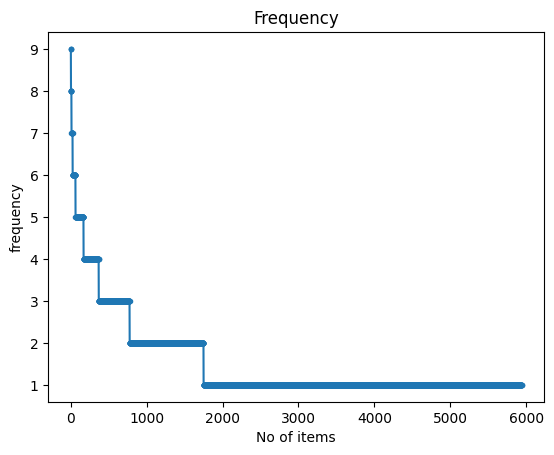

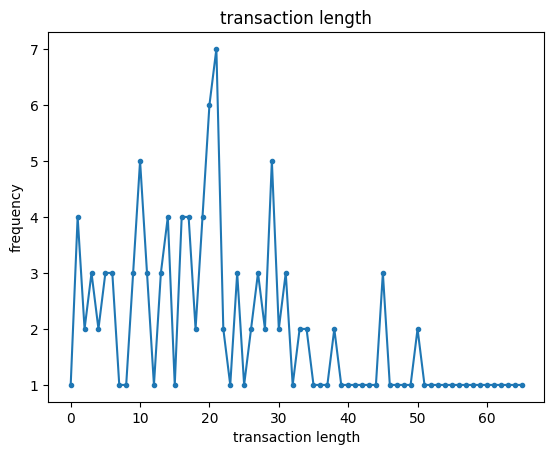

In [105]:
from PAMI.extras.dbStats import TransactionalDatabase as tds
obj = tds.TransactionalDatabase('td_freq_db_comp_graphics.csv')
obj.run()
obj.printStats()
obj.plotGraphs()

Database size (total no of transactions) : 594
Number of items : 15283
Minimum Transaction Size : 9
Average Transaction Size : 74.55892255892256
Maximum Transaction Size : 1070
Standard Deviation Transaction Size : 115.43440452043433
Variance in Transaction Sizes : 13347.572407606136
Sparsity : 0.9951214471923757


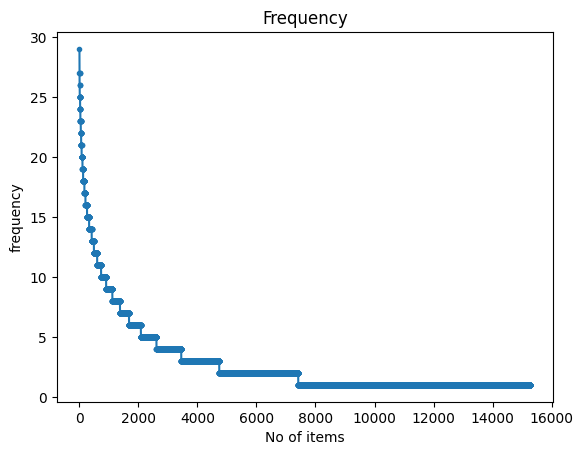

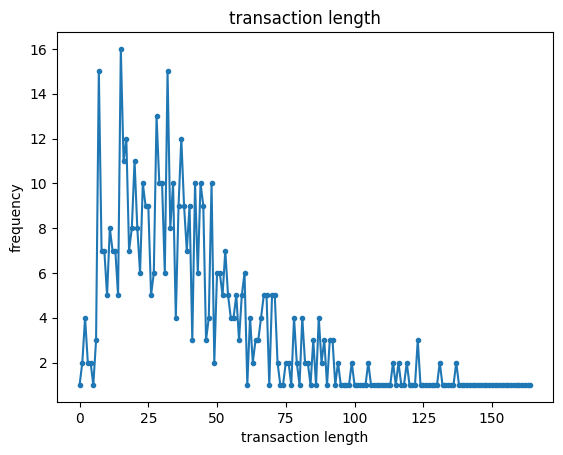

In [106]:
from PAMI.extras.dbStats import TransactionalDatabase as tds
obj = tds.TransactionalDatabase('td_freq_db_sci_med.csv')
obj.run()
obj.printStats()
obj.plotGraphs()

Database size (total no of transactions) : 599
Number of items : 13041
Minimum Transaction Size : 2
Average Transaction Size : 77.04507512520868
Maximum Transaction Size : 460
Standard Deviation Transaction Size : 62.384260554199
Variance in Transaction Sizes : 3898.3039849023735
Sparsity : 0.9940920884038641


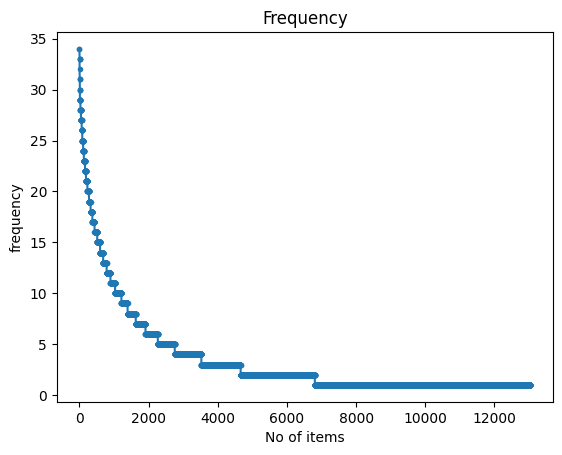

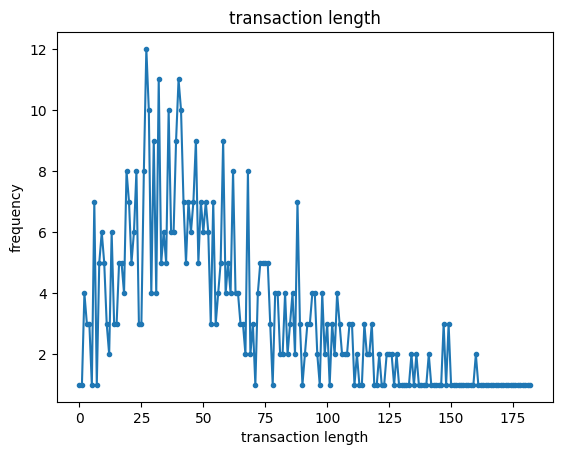

In [107]:
from PAMI.extras.dbStats import TransactionalDatabase as tds
obj = tds.TransactionalDatabase('td_freq_db_soc_religion_christian.csv')
obj.run()
obj.printStats()
obj.plotGraphs()

Database size (total no of transactions) : 480
Number of items : 11250
Minimum Transaction Size : 5
Average Transaction Size : 75.59791666666666
Maximum Transaction Size : 1395
Standard Deviation Transaction Size : 105.33869380396925
Variance in Transaction Sizes : 11119.405841162144
Sparsity : 0.9932801851851852


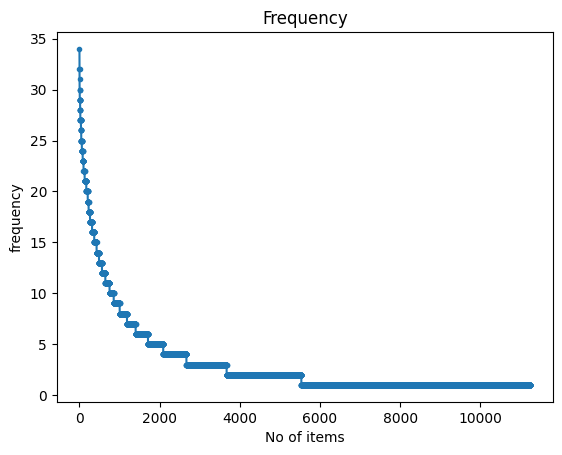

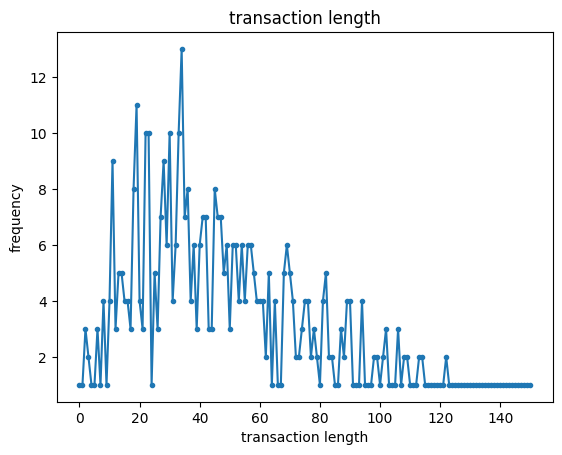

In [108]:
from PAMI.extras.dbStats import TransactionalDatabase as tds
obj = tds.TransactionalDatabase('td_freq_db_alt_atheism.csv')
obj.run()
obj.printStats()
obj.plotGraphs()

In [109]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj1 = alg.FPGrowth(iFile='td_freq_db_sci_med.csv', minSup=minSup)
obj1.mine()
frequentPatternsDF_sci_med= obj1.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_sci_med))) #print the total number of patterns
print('Runtime: ' + str(obj1.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 10000
Runtime: 0.17003178596496582


In [110]:
obj1.save('freq_patterns_sci_med_minSup9.txt') #save the patterns
frequentPatternsDF_sci_med

,Patterns,Support
0,leave,9
1,swell,9
2,color,9
3,confused,9
4,learning,9
...,...,...
9995,means,27
9996,haven,27
9997,happen,27
9998,originator,27


In [111]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj2 = alg.FPGrowth(iFile='td_freq_db_alt_atheism.csv', minSup=minSup)
obj2.mine()
frequentPatternsDF_alt_atheism= obj2.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_alt_atheism))) #print the total number of patterns
print('Runtime: ' + str(obj2.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 4676
Runtime: 0.21700763702392578


In [112]:
obj2.save('freq_patterns_alt_atheism_minSup9.txt') #save the patterns
pd.reset_option('display.max_rows')
frequentPatternsDF_alt_atheism

,Patterns,Support
0,choices,9
1,corp,9
2,hausmann,9
3,hausmann maddi,9
4,kids,9
...,...,...
4671,date,31
4672,date gmt,19
4673,stay,32
4674,snm6394,32


In [113]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj3 = alg.FPGrowth(iFile='td_freq_db_comp_graphics.csv', minSup=minSup)
obj3.mine()
frequentPatternsDF_comp_graphics= obj3.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_comp_graphics))) #print the total number of patterns
print('Runtime: ' + str(obj3.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 3
Runtime: 0.0039980411529541016


In [114]:
obj3.save('freq_patterns_comp_graphics_minSup9.txt') #save the patterns
frequentPatternsDF_comp_graphics

,Patterns,Support
0,words,9
1,26,9
2,needs,9


In [115]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj4 = alg.FPGrowth(iFile='td_freq_db_soc_religion_christian.csv', minSup=minSup)
obj4.mine()
frequentPatternsDF_soc_religion_christian= obj4.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_soc_religion_christian))) #print the total number of patterns
print('Runtime: ' + str(obj4.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 11213
Runtime: 0.21200060844421387


In [116]:
obj4.save('freq_patterns_soc_religion_minSup9.txt') #save the patterns
frequentPatternsDF_soc_religion_christian

,Patterns,Support
0,latest,9
1,san,9
2,seven,9
3,schools,9
4,chose,9
...,...,...
11208,34,33
11209,institute,33
11210,ways,33
11211,oh,34


In [117]:
import pandas as pd

#We group together all of the dataframes related to our found patterns
dfs = [frequentPatternsDF_sci_med, frequentPatternsDF_soc_religion_christian, frequentPatternsDF_comp_graphics, frequentPatternsDF_alt_atheism]


# Identify patterns that appear in more than one category
# Count how many times each pattern appears across all dataframes
pattern_counts = {}
for df in dfs:
    for pattern in df['Patterns']:
        if pattern not in pattern_counts:
            pattern_counts[pattern] = 1
        else:
            pattern_counts[pattern] += 1

# Filter out patterns that appear in more than one dataframe
unique_patterns = {pattern for pattern, count in pattern_counts.items() if count == 1}
# Calculate the total number of patterns across all categories
total_patterns_count = sum(len(df) for df in dfs)
# Calculate how many patterns were discarded
discarded_patterns_count = total_patterns_count - len(unique_patterns)

# For each category, filter the patterns to keep only the unique ones
filtered_dfs = []
for df in dfs:
    filtered_df = df[df['Patterns'].isin(unique_patterns)]
    filtered_dfs.append(filtered_df)

# Merge the filtered dataframes into a final dataframe
final_pattern_df = pd.concat(filtered_dfs, ignore_index=True)

# Sort by support
final_pattern_df = final_pattern_df.sort_values(by='Support', ascending=False)

# Display the final result
print(final_pattern_df)
# Print the number of discarded patterns
print(f"Number of patterns discarded: {discarded_patterns_count}")

                         Patterns  Support
24105                         gmt       34
20032                   institute       33
20031                         gov       33
24104                     snm6394       32
20030                        form       31
...                           ...      ...
20858  princeton al et motss axes        9
20857       soc et boy motss axes        9
20856       soc al boy motss axes        9
20855        soc al et motss axes        9
0                           swell        9

[24106 rows x 2 columns]
Number of patterns discarded: 1786


In [118]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

# Convert 'text' column into term-document matrix using CountVectorizer
count_vect = CountVectorizer()
X_tdm = count_vect.fit_transform(X['text'])  # X['text'] contains your text data
terms = count_vect.get_feature_names_out()  # Original terms in the vocabulary

# Tokenize the sentences into sets of unique words
X['tokenized_text'] = X['text'].str.split().apply(set)

# Initialize the pattern matrix
pattern_matrix = pd.DataFrame(0, index=X.index, columns=final_pattern_df['Patterns'])

# Iterate over each pattern and check if all words in the pattern are present in the tokenized sentence
for pattern in final_pattern_df['Patterns']:
    pattern_words = set(pattern.split())  # Tokenize pattern into words
    pattern_matrix[pattern] = X['tokenized_text'].apply(lambda x: 1 if pattern_words.issubset(x) else 0)

# Convert the term-document matrix to a DataFrame for easy merging
tdm_df = pd.DataFrame(X_tdm.toarray(), columns=terms, index=X.index)

# Concatenate the original TDM and the pattern matrix to augment the features
augmented_df = pd.concat([tdm_df, pattern_matrix], axis=1)

augmented_df

,00,000,0000,0000001200,000005102000,0001,000100255pixel,00014,000406,0007,...,soc princeton al boy motss axes,al et boy motss axes,soc princeton boy motss axes,princeton et boy motss axes,princeton al boy motss axes,princeton al et motss axes,soc et boy motss axes,soc al boy motss axes,soc al et motss axes,swell
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2252,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2253,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2254,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2255,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


#### Exercise 17 - solution

In [119]:
from PAMI.frequentPattern.topk import FAE  as alg

inputFile = 'td_freq_db_comp_graphics.csv'

kCount=400  #Users can also specify this constraint between 0 to 1.

seperator='\t'


obj = alg.FAE(iFile=inputFile, k=kCount, sep=seperator)    #initialize
obj.mine()            #Start the mining process

obj.save(outFile='frequentPatternsMinSupCount500.txt')
frequentPatternsDF= obj.getPatternsAsDataFrame()

print('Total No of patterns: ' + str(len(frequentPatternsDF)))
print('Runtime: ' + str(obj.getRuntime()))
print('Memory (RSS): ' + str(obj.getMemoryRSS()))
print('Memory (USS): ' + str(obj.getMemoryUSS()))

frequentPatternsDF

 TopK frequent patterns were successfully generated using FAE algorithm.
Total No of patterns: 400
Runtime: 3.213970184326172
Memory (RSS): 7111942144
Memory (USS): 7115988992


,Patterns,Support
0,words,9
1,26,9
2,needs,9
3,displaying,8
4,recently,8
...,...,...
395,believe asked,4
396,believe port,4
397,mapping 44,4
398,mapping texture,4


In [120]:
from PAMI.frequentPattern.topk import FAE  as alg

inputFile = 'td_freq_db_comp_graphics.csv'

kCount=500  #Users can also specify this constraint between 0 to 1.

seperator='\t'


obj = alg.FAE(iFile=inputFile, k=kCount, sep=seperator)    #initialize
obj.mine()            #Start the mining process

obj.save(outFile='frequentPatternsMinSupCount500.txt')
frequentPatternsDF= obj.getPatternsAsDataFrame()

print('Total No of patterns: ' + str(len(frequentPatternsDF)))
print('Runtime: ' + str(obj.getRuntime()))
print('Memory (RSS): ' + str(obj.getMemoryRSS()))
print('Memory (USS): ' + str(obj.getMemoryUSS()))

frequentPatternsDF

 TopK frequent patterns were successfully generated using FAE algorithm.
Total No of patterns: 500
Runtime: 5.278031826019287
Memory (RSS): 7111987200
Memory (USS): 7116017664


,Patterns,Support
0,words,9
1,26,9
2,needs,9
3,displaying,8
4,recently,8
...,...,...
495,significance philosophical ulrich,4
496,toppoint galki suggestions philosophical ulrich,4
497,galki suggestions philosophical toppoint,4
498,galki suggestions philosophical ulrich,4


In [121]:
from PAMI.frequentPattern.topk import FAE  as alg

inputFile = 'td_freq_db_comp_graphics.csv'

kCount=600  #Users can also specify this constraint between 0 to 1.

seperator='\t'


obj = alg.FAE(iFile=inputFile, k=kCount, sep=seperator)    #initialize
obj.mine()            #Start the mining process

obj.save(outFile='frequentPatternsMinSupCount500.txt')
frequentPatternsDF= obj.getPatternsAsDataFrame()

print('Total No of patterns: ' + str(len(frequentPatternsDF)))
print('Runtime: ' + str(obj.getRuntime()))
print('Memory (RSS): ' + str(obj.getMemoryRSS()))
print('Memory (USS): ' + str(obj.getMemoryUSS()))

frequentPatternsDF

 TopK frequent patterns were successfully generated using FAE algorithm.
Total No of patterns: 600
Runtime: 44.34403347969055
Memory (RSS): 7112011776
Memory (USS): 7116042240


,Patterns,Support
0,words,9
1,26,9
2,needs,9
3,displaying,8
4,recently,8
...,...,...
595,topic,3
596,yourself,3
597,03,3
598,aim,3


In [122]:
#try to do it through the code
from PAMI.frequentPattern.maximal import MaxFPGrowth  as alg #import the algorithm

obj = alg.MaxFPGrowth(iFile='td_freq_db_comp_graphics.csv', minSup=3, sep='\t') #initialize
obj.mine()            #start the mining process

obj.save('maximalFrequentPatternsAtMinSupCount3.txt') #save the patterns

frequentPatternsDF= obj.getPatternsAsDataFrame() #get the generated frequent patterns as a dataframe
print('Total No of patterns: ' + str(len(frequentPatternsDF))) #print the total number of patterns
print('Runtime: ' + str(obj.getRuntime())) #measure the runtime

print('Memory (RSS): ' + str(obj.getMemoryRSS()))
print('Memory (USS): ' + str(obj.getMemoryUSS()))

frequentPatternsDF

Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns: 630
Runtime: 0.10999846458435059
Memory (RSS): 7112081408
Memory (USS): 7116111872


,Patterns,Support
0,650,3
1,trouble expect show gmt asked plain cpu fact c...,3
2,spatial,3
3,illinois,3
4,chicago,3
...,...,...
625,always didn,3
626,words long,3
627,words looks,3
628,words always,3


In [123]:
#try to do it through the code
from PAMI.frequentPattern.maximal import MaxFPGrowth  as alg #import the algorithm

obj = alg.MaxFPGrowth(iFile='td_freq_db_comp_graphics.csv', minSup=6, sep='\t') #initialize
obj.mine()            #start the mining process

obj.save('maximalFrequentPatternsAtMinSupCount3.txt') #save the patterns

frequentPatternsDF= obj.getPatternsAsDataFrame() #get the generated frequent patterns as a dataframe
print('Total No of patterns: ' + str(len(frequentPatternsDF))) #print the total number of patterns
print('Runtime: ' + str(obj.getRuntime())) #measure the runtime

print('Memory (RSS): ' + str(obj.getMemoryRSS()))
print('Memory (USS): ' + str(obj.getMemoryUSS()))

frequentPatternsDF

Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns: 63
Runtime: 0.0059659481048583984
Memory (RSS): 7112081408
Memory (USS): 7116111872


,Patterns,Support
0,31,6
1,tried,6
2,easily,6
3,add,6
4,specific,6
...,...,...
58,recently,8
59,displaying,8
60,needs,9
61,26,9


In [124]:
#try to do it through the code
from PAMI.frequentPattern.maximal import MaxFPGrowth  as alg #import the algorithm

obj = alg.MaxFPGrowth(iFile='td_freq_db_comp_graphics.csv', minSup=9, sep='\t') #initialize
obj.mine()            #start the mining process

obj.save('maximalFrequentPatternsAtMinSupCount3.txt') #save the patterns

frequentPatternsDF= obj.getPatternsAsDataFrame() #get the generated frequent patterns as a dataframe
print('Total No of patterns: ' + str(len(frequentPatternsDF))) #print the total number of patterns
print('Runtime: ' + str(obj.getRuntime())) #measure the runtime

print('Memory (RSS): ' + str(obj.getMemoryRSS()))
print('Memory (USS): ' + str(obj.getMemoryUSS()))

frequentPatternsDF

Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns: 3
Runtime: 0.004000425338745117
Memory (RSS): 7112093696
Memory (USS): 7116124160


,Patterns,Support
0,needs,9
1,26,9
2,words,9


### Insights
##### Performance:
##### Runtime of FAE Top-K alg takes longer than MaxFPGrowth alg, moveover, with the increase of k number, the runtime increases as well
##### The number of patterns is related to the number of k that we set by ourselves in FAE Top-K alg, however, there is no common analogy with maxFPGrowth alg
##### Looks like the output of FAE Top-K algorithm is ordered, starting with patterns that have max support ranging to the patterns with minumum support, however, output of maxFPGrowth algorithm looks unordered

##### Supplementary code for copied from Master notebook, so that the all homework can be run here at once

In [125]:
#Applying dimensionality reduction with only the document-term frequency data
import numpy as np
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import matplotlib.pyplot as plt

#This might take a couple of minutes to execute
# Apply PCA, t-SNE, and UMAP to the data
X_pca_tdm = PCA(n_components=2).fit_transform(tdm_df.values)
X_tsne_tdm = TSNE(n_components=2).fit_transform(tdm_df.values)
X_umap_tdm = umap.UMAP(n_components=2).fit_transform(tdm_df.values)

ImportError: DLL load failed while importing _multiarray_umath: The specified module could not be found.

ImportError: DLL load failed while importing _multiarray_umath: The specified module could not be found.

ImportError: DLL load failed while importing _multiarray_umath: The specified module could not be found.

ImportError: _multiarray_umath failed to import

C:\Users\JennisH\AppData\Roaming\Python\Python39\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\JennisH\AppData\Roaming\Python\Python39\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



In [126]:
X_pca_tdm.shape

(2257, 2)

In [127]:
X_tsne_tdm.shape

(2257, 2)

In [128]:
X_umap_tdm.shape

(2257, 2)

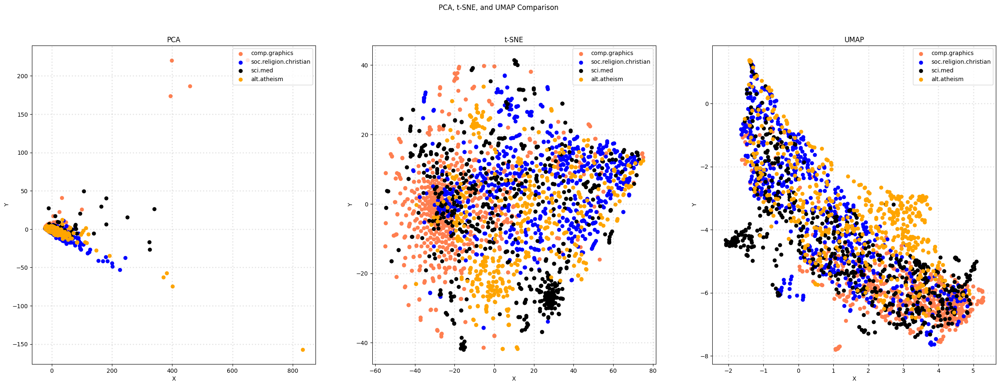

In [129]:
# Plot the results in subplots
col = ['coral', 'blue', 'black', 'orange']
categories = X['category_name'].unique() 

fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a scatter plot for each method
def plot_scatter(ax, X_reduced, title):
    for c, category in zip(col, categories):
        xs = X_reduced[X['category_name'] == category].T[0]
        ys = X_reduced[X['category_name'] == category].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

# Step 4: Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter(axes[0], X_pca_tdm, 'PCA')
plot_scatter(axes[1], X_tsne_tdm, 't-SNE')
plot_scatter(axes[2], X_umap_tdm, 'UMAP')

plt.show()

In [130]:
#This might take a couple of minutes to execute
#Applying dimensionality reduction with both the document-term frequency data and the pattern derived data
# Apply PCA, t-SNE, and UMAP to the data
X_pca_aug = PCA(n_components=2).fit_transform(augmented_df.values)
X_tsne_aug = TSNE(n_components=2).fit_transform(augmented_df.values)
X_umap_aug = umap.UMAP(n_components=2).fit_transform(augmented_df.values)

C:\Users\JennisH\AppData\Roaming\Python\Python39\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\JennisH\AppData\Roaming\Python\Python39\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



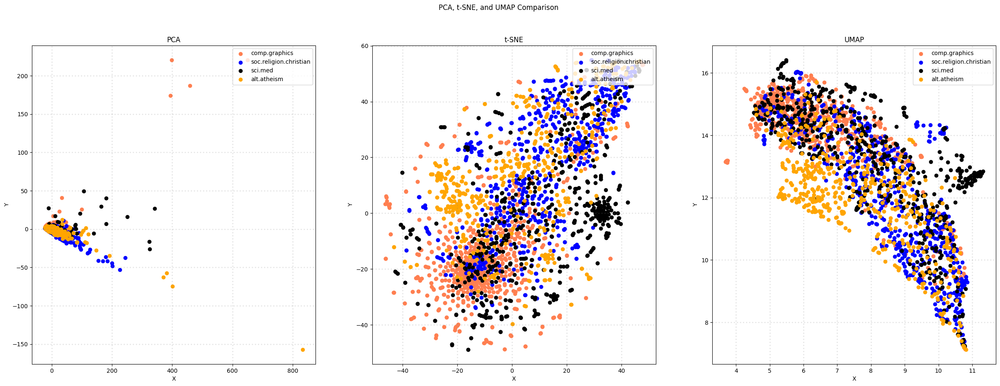

In [131]:
# Plot the results in subplots
col = ['coral', 'blue', 'black', 'orange']
categories = X['category_name'].unique() 

fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a scatter plot for each method
def plot_scatter(ax, X_reduced, title):
    for c, category in zip(col, categories):
        xs = X_reduced[X['category_name'] == category].T[0]
        ys = X_reduced[X['category_name'] == category].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

# Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter(axes[0], X_pca_aug, 'PCA')
plot_scatter(axes[1], X_tsne_aug, 't-SNE')
plot_scatter(axes[2], X_umap_aug, 'UMAP')

plt.show()

#### Exercise 18 - solution

In [132]:
X_pca_tdm = PCA(n_components=3).fit_transform(tdm_df.values)
X_tsne_tdm = TSNE(n_components=3).fit_transform(tdm_df.values)
X_umap_tdm = umap.UMAP(n_components=3).fit_transform(tdm_df.values)

C:\Users\JennisH\AppData\Roaming\Python\Python39\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\JennisH\AppData\Roaming\Python\Python39\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



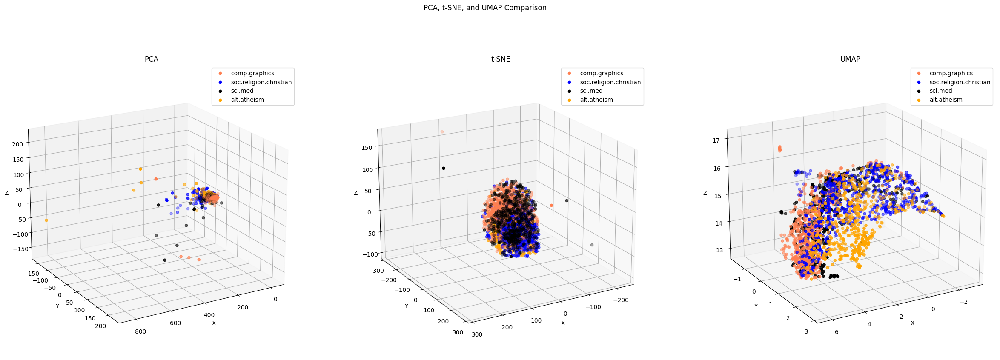

In [134]:
from mpl_toolkits.mplot3d import Axes3D 
import matplotlib.pyplot as plt

col = ['coral', 'blue', 'black', 'orange']
categories = X['category_name'].unique() 

fig = plt.figure(figsize=(30, 10)) 
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a 3D scatter plot for each method
def plot_scatter_for_three_dimensions(ax, X_reduced, title):
    for c, category in zip(col, categories):
        xs = X_reduced[X['category_name'] == category].T[0]
        ys = X_reduced[X['category_name'] == category].T[1]
        zs = X_reduced[X['category_name'] == category].T[2]
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)
    
    ax.grid(color='black', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend(loc='upper right')

ax1 = fig.add_subplot(131, projection='3d')
ax2 = fig.add_subplot(132, projection='3d')
ax3 = fig.add_subplot(133, projection='3d')

plot_scatter_for_three_dimensions(ax1, X_pca_tdm, 'PCA')
plot_scatter_for_three_dimensions(ax2, X_tsne_tdm, 't-SNE')
plot_scatter_for_three_dimensions(ax3, X_umap_tdm, 'UMAP')

ax1.view_init(elev=20, azim=60)   
ax2.view_init(elev=20, azim=60)  
ax3.view_init(elev=20, azim=60)  

plt.show()

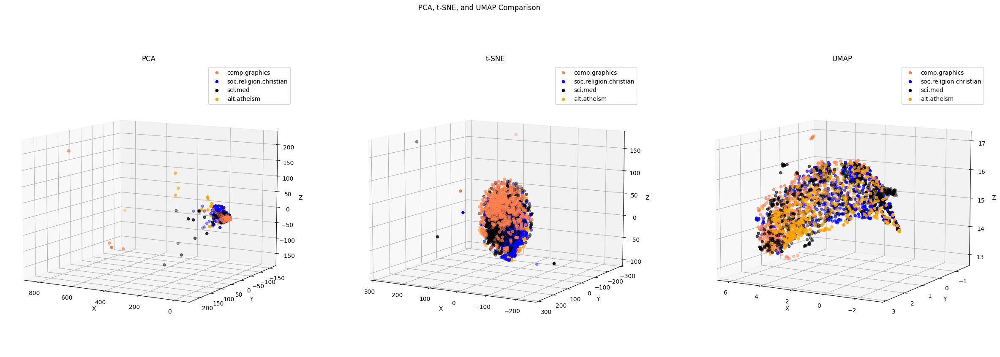

In [135]:
from mpl_toolkits.mplot3d import Axes3D 
import matplotlib.pyplot as plt

col = ['coral', 'blue', 'black', 'orange']
categories = X['category_name'].unique() 

fig = plt.figure(figsize=(30, 10)) 
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a 3D scatter plot for each method
def plot_scatter_for_three_dimensions(ax, X_reduced, title):
    for c, category in zip(col, categories):
        xs = X_reduced[X['category_name'] == category].T[0]
        ys = X_reduced[X['category_name'] == category].T[1]
        zs = X_reduced[X['category_name'] == category].T[2]
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)
    
    ax.grid(color='black', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend(loc='upper right')

ax1 = fig.add_subplot(131, projection='3d')
ax2 = fig.add_subplot(132, projection='3d')
ax3 = fig.add_subplot(133, projection='3d')

plot_scatter_for_three_dimensions(ax1, X_pca_tdm, 'PCA')
plot_scatter_for_three_dimensions(ax2, X_tsne_tdm, 't-SNE')
plot_scatter_for_three_dimensions(ax3, X_umap_tdm, 'UMAP')

ax1.view_init(elev=10, azim=120)   
ax2.view_init(elev=10, azim=120)  
ax3.view_init(elev=10, azim=120)  

plt.show()

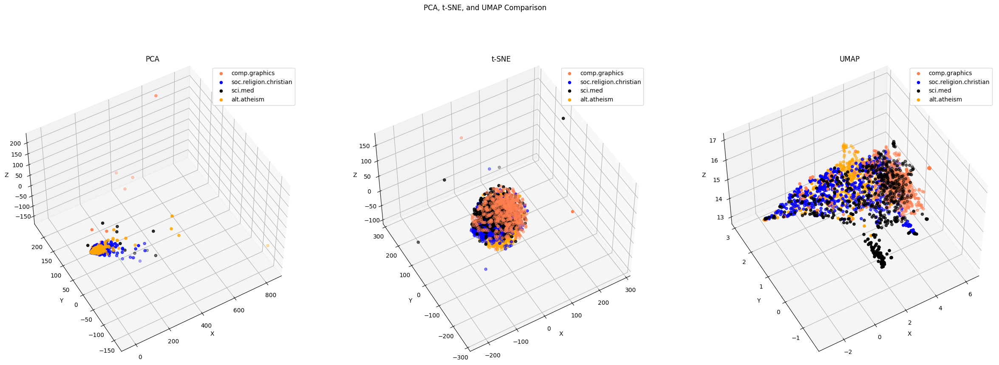

In [136]:
from mpl_toolkits.mplot3d import Axes3D 
import matplotlib.pyplot as plt

col = ['coral', 'blue', 'black', 'orange']
categories = X['category_name'].unique() 

fig = plt.figure(figsize=(30, 10)) 
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a 3D scatter plot for each method
def plot_scatter_for_three_dimensions(ax, X_reduced, title):
    for c, category in zip(col, categories):
        xs = X_reduced[X['category_name'] == category].T[0]
        ys = X_reduced[X['category_name'] == category].T[1]
        zs = X_reduced[X['category_name'] == category].T[2]
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)
    
    ax.grid(color='black', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend(loc='upper right')

ax1 = fig.add_subplot(131, projection='3d')
ax2 = fig.add_subplot(132, projection='3d')
ax3 = fig.add_subplot(133, projection='3d')

plot_scatter_for_three_dimensions(ax1, X_pca_tdm, 'PCA')
plot_scatter_for_three_dimensions(ax2, X_tsne_tdm, 't-SNE')
plot_scatter_for_three_dimensions(ax3, X_umap_tdm, 'UMAP')

ax1.view_init(elev=50, azim=240)   
ax2.view_init(elev=50, azim=240)  
ax3.view_init(elev=50, azim=240)  

plt.show()

##### Supplementary code for copied from Master notebook, so that the all homework can be run here at once

In [137]:
from sklearn import preprocessing, metrics, decomposition, pipeline, dummy

In [138]:
mlb = preprocessing.LabelBinarizer()

In [139]:
mlb.fit(X.category)

LabelBinarizer()

In [140]:
X['bin_category'] = mlb.transform(X['category']).tolist()

In [141]:
X[0:9]

,text,category,category_name,unigrams,tokenized_text,bin_category
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,"[From, :, sd345, @, city.ac.uk, (, Michael, Co...","{files, Subject:, Unit,, LaserJet, do, in, the...","[0, 1, 0, 0]"
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics,"[From, :, ani, @, ms.uky.edu, (, Aniruddha, B....","{Subject:, which, solve., problem, split, huma...","[0, 1, 0, 0]"
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,"[From, :, djohnson, @, cs.ucsd.edu, (, Darin, ...","{problem, do, husband,, seeing, ask, companies...","[0, 0, 0, 1]"
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,"[From, :, s0612596, @, let.rug.nl, (, M.M, ., ...","{on, Subject:, I'm, church-state(government).,...","[0, 0, 0, 1]"
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian,"[From, :, stanly, @, grok11.columbiasc.ncr.com...","{Subject:, which, died, find, ""The, the, >hmmm...","[0, 0, 0, 1]"
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian,"[From, :, vbv, @, lor.eeap.cwru.edu, (, Virgil...","{Subject:, tranfusion, referee!"", could, gener...","[0, 0, 0, 1]"
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian,"[From, :, jodfishe, @, silver.ucs.indiana.edu,...","{Please,, strong, Subject:, controlled, bad., ...","[0, 0, 0, 1]"
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med,"[From, :, aldridge, @, netcom.com, (, Jacqueli...","{scaliness, mousse,, wary, do, scalp, leave, n...","[0, 0, 1, 0]"
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med,"[From, :, geb, @, cs.pitt.edu, (, Gordon, Bank...","{Subject:, Pittsburgh, RGB., 2, the, in, commo...","[0, 0, 1, 0]"


#### Exercise 19 - solution

In [142]:
mlb = preprocessing.LabelBinarizer()

In [143]:
mlb.fit(X.category_name)

LabelBinarizer()

In [144]:
X['bin_category_name'] = mlb.transform(X['category_name']).tolist()

In [145]:
X[0:20]

,text,category,category_name,unigrams,tokenized_text,bin_category,bin_category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,"[From, :, sd345, @, city.ac.uk, (, Michael, Co...","{files, Subject:, Unit,, LaserJet, do, in, the...","[0, 1, 0, 0]","[0, 1, 0, 0]"
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics,"[From, :, ani, @, ms.uky.edu, (, Aniruddha, B....","{Subject:, which, solve., problem, split, huma...","[0, 1, 0, 0]","[0, 1, 0, 0]"
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,"[From, :, djohnson, @, cs.ucsd.edu, (, Darin, ...","{problem, do, husband,, seeing, ask, companies...","[0, 0, 0, 1]","[0, 0, 0, 1]"
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,"[From, :, s0612596, @, let.rug.nl, (, M.M, ., ...","{on, Subject:, I'm, church-state(government).,...","[0, 0, 0, 1]","[0, 0, 0, 1]"
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian,"[From, :, stanly, @, grok11.columbiasc.ncr.com...","{Subject:, which, died, find, ""The, the, >hmmm...","[0, 0, 0, 1]","[0, 0, 0, 1]"
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian,"[From, :, vbv, @, lor.eeap.cwru.edu, (, Virgil...","{Subject:, tranfusion, referee!"", could, gener...","[0, 0, 0, 1]","[0, 0, 0, 1]"
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian,"[From, :, jodfishe, @, silver.ucs.indiana.edu,...","{Please,, strong, Subject:, controlled, bad., ...","[0, 0, 0, 1]","[0, 0, 0, 1]"
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med,"[From, :, aldridge, @, netcom.com, (, Jacqueli...","{scaliness, mousse,, wary, do, scalp, leave, n...","[0, 0, 1, 0]","[0, 0, 1, 0]"
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med,"[From, :, geb, @, cs.pitt.edu, (, Gordon, Bank...","{Subject:, Pittsburgh, RGB., 2, the, in, commo...","[0, 0, 1, 0]","[0, 0, 1, 0]"
9,From: libman@hsc.usc.edu (Marlena Libman) Subj...,2,sci.med,"[From, :, libman, @, hsc.usc.edu, (, Marlena, ...","{Subject:, I'm, which, polite, wants, want,, p...","[0, 0, 1, 0]","[0, 0, 1, 0]"


### Insights
##### Looks like it gives the similar output as before, it seems like it works

## The second part of homework 

##### I downloaded the data from website and imported to the same folder with the code

In [226]:
import pandas as pd

df = pd.read_csv('Nostalgic_Sentiment_Analysis_of_YouTube_Comments_Data.csv')

print(df.head(100))

        sentiment                                            comment
0   not nostalgia  He was a singer with a golden voice that I lov...
1       nostalgia  The mist beautiful voice ever I listened to hi...
2       nostalgia  I have most of Mr. Reeves songs.  Always love ...
3   not nostalgia  30 day leave from 1st tour in Viet Nam to conv...
4       nostalgia  listening to his songs reminds me of my mum wh...
..            ...                                                ...
95  not nostalgia  My mom told me to look him up and listen to th...
96  not nostalgia  Why many of the great great  singers never liv...
97      nostalgia  When I was young did not like Elvis,loved the ...
98  not nostalgia  this song makes me cry every single time -so m...
99  not nostalgia  I wish I lived in this song's generation.... I...

[100 rows x 2 columns]


In [227]:
# categories - there are only two of them
categories = ['not nostalgia','nostalgia']

In [228]:
#quick look
df[0:10]

,sentiment,comment
0,not nostalgia,He was a singer with a golden voice that I lov...
1,nostalgia,The mist beautiful voice ever I listened to hi...
2,nostalgia,I have most of Mr. Reeves songs. Always love ...
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...
4,nostalgia,listening to his songs reminds me of my mum wh...
5,nostalgia,"Every time I heard this song as a child, I use..."
6,nostalgia,"My dad loved listening to Jim Reeves, when I w..."
7,nostalgia,i HAVE ALSO LISTENED TO Jim Reeves since child...
8,not nostalgia,Wherever you are you always in my heart
9,not nostalgia,Elvis will always be number one no one can com...


In [229]:
#printing out the text data for the first three samples in the dataset

for comment in df['comment'][:3]:
    print(comment)

He was a singer with a golden voice that I love to hear all the time. I was his great fan at the age of 16years in those days and still now. Although we have many singers now, but, I can vouch for Jim Reeves all the time. You feel relaxed, emotional and loving. Thank you Lord for his life.
The mist beautiful voice ever I listened to him when I was a kid and still love his singing Never forgotten The voice of an angel
I have most of Mr. Reeves songs.  Always love his smooth voice, so comforting and sounds like the people I grew up around.  They were so gentle and sweet, but I had to leave my little town to find a job at age 17.  I graduated early.  I never forgot how great it was to grow up with simple people who had no pretensions -- just loving and gentle, like I think Jesus is.


In [230]:
#we already have df

# we can convert comments to the list
comments = df['comment'].tolist()  
print(comments[:20])

['He was a singer with a golden voice that I love to hear all the time. I was his great fan at the age of 16years in those days and still now. Although we have many singers now, but, I can vouch for Jim Reeves all the time. You feel relaxed, emotional and loving. Thank you Lord for his life.', 'The mist beautiful voice ever I listened to him when I was a kid and still love his singing Never forgotten The voice of an angel', 'I have most of Mr. Reeves songs.  Always love his smooth voice, so comforting and sounds like the people I grew up around.  They were so gentle and sweet, but I had to leave my little town to find a job at age 17.  I graduated early.  I never forgot how great it was to grow up with simple people who had no pretensions -- just loving and gentle, like I think Jesus is.', '30 day leave from 1st tour in Viet Nam to convince my Mary Lou to "marry me" when I came back from my 2nd tour.  Now, 47 years later this December God granted the greatest blessing a man can receive

In [231]:
len(comments)

1500

In [232]:
### adding the category column
df['category'] = df['sentiment'].apply(lambda x: 1 if x == 'nostalgia' else 0)
print(df.head())

       sentiment                                            comment  category
0  not nostalgia  He was a singer with a golden voice that I lov...         0
1      nostalgia  The mist beautiful voice ever I listened to hi...         1
2      nostalgia  I have most of Mr. Reeves songs.  Always love ...         1
3  not nostalgia  30 day leave from 1st tour in Viet Nam to conv...         0
4      nostalgia  listening to his songs reminds me of my mum wh...         1


In [233]:
df[0:10]

,sentiment,comment,category
0,not nostalgia,He was a singer with a golden voice that I lov...,0
1,nostalgia,The mist beautiful voice ever I listened to hi...,1
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,1
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,0
4,nostalgia,listening to his songs reminds me of my mum wh...,1
5,nostalgia,"Every time I heard this song as a child, I use...",1
6,nostalgia,"My dad loved listening to Jim Reeves, when I w...",1
7,nostalgia,i HAVE ALSO LISTENED TO Jim Reeves since child...,1
8,not nostalgia,Wherever you are you always in my heart,0
9,not nostalgia,Elvis will always be number one no one can com...,0


In [234]:
#familiriazing with the data
#last 10 records query
df[-10:]

,sentiment,comment,category
1490,not nostalgia,"He really isn't my cup of tea, but some of his...",0
1491,nostalgia,real music...how i miss those days...brings ba...,1
1492,nostalgia,i used to cry over this song cause i had a boy...,1
1493,not nostalgia,"He really has that ""love you like a brother"" l...",0
1494,not nostalgia,That's funny. But Leo really is a nice guy. He...,0
1495,not nostalgia,"i don't know!..but the opening of the video,.....",0
1496,not nostalgia,it's sad this is such a beautiful song when yo...,0
1497,not nostalgia,"Dear Friend, I think age and time is not that ...",0
1498,nostalgia,I was born in 1954 and started to be aware of ...,1
1499,nostalgia,This is the first CD I bought after my marriag...,1


In [235]:
# using loc (by label)
df.loc[:10, 'comment']

0     He was a singer with a golden voice that I lov...
1     The mist beautiful voice ever I listened to hi...
2     I have most of Mr. Reeves songs.  Always love ...
3     30 day leave from 1st tour in Viet Nam to conv...
4     listening to his songs reminds me of my mum wh...
5     Every time I heard this song as a child, I use...
6     My dad loved listening to Jim Reeves, when I w...
7     i HAVE ALSO LISTENED TO Jim Reeves since child...
8              Wherever you  are you always in my heart
9     Elvis will always be number one no one can com...
10    ill bet if they begin to play this song on the...
Name: comment, dtype: object

In [236]:
# using iloc (by position)
df.iloc[:10, 0]

0    not nostalgia
1        nostalgia
2        nostalgia
3    not nostalgia
4        nostalgia
5        nostalgia
6        nostalgia
7        nostalgia
8    not nostalgia
9    not nostalgia
Name: sentiment, dtype: object

In [237]:
#fetch records belonging to the nostalgia category, and query every 10th record. Only show the first 5 records.
print(df[df['sentiment']=='nostalgia'].iloc[::10][0:5])

    sentiment                                            comment  category
1   nostalgia  The mist beautiful voice ever I listened to hi...         1
18  nostalgia  My Grandparents had a pub in the 1970's, this ...         1
32  nostalgia  I remember my Mom listening to Jim over and ov...         1
50  nostalgia  If I remember correctly, this song came out af...         1
71  nostalgia  Gosh does this bring back memories. Nearly eve...         1


In [238]:
#missing data handling
df.isnull()

,sentiment,comment,category
0,False,False,False
1,False,False,False
2,False,False,False
3,False,False,False
4,False,False,False
...,...,...,...
1495,False,False,False
1496,False,False,False
1497,False,False,False
1498,False,False,False


In [239]:
df.isnull().apply(lambda x: dmh.check_missing_values(x))

,sentiment,comment,category
0,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:
1,0,0,0


In [240]:
df.isnull().apply(lambda x: dmh.check_missing_values(x), axis =1)

0       (The amoung of missing records is: , 0)
1       (The amoung of missing records is: , 0)
2       (The amoung of missing records is: , 0)
3       (The amoung of missing records is: , 0)
4       (The amoung of missing records is: , 0)
                         ...                   
1495    (The amoung of missing records is: , 0)
1496    (The amoung of missing records is: , 0)
1497    (The amoung of missing records is: , 0)
1498    (The amoung of missing records is: , 0)
1499    (The amoung of missing records is: , 0)
Length: 1500, dtype: object

In [241]:
#adding a dummy missing value record
dummy_series = pd.Series(["dummy_record", 1], index=["sentiment", "comment"])

In [242]:
dummy_series

sentiment    dummy_record
comment                 1
dtype: object

In [243]:
dummy_series.to_frame().T
# .to_frame() -> Convert Series to DataFrame
# .T          -> Transpose

,sentiment,comment
0,dummy_record,1


In [244]:
result_with_series = pd.concat([df, dummy_series.to_frame().T], ignore_index=True)

In [245]:
# check if the records was commited into result
len(result_with_series)

1501

In [246]:
result_with_series.isnull().apply(lambda x: dmh.check_missing_values(x))

,sentiment,comment,category
0,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:
1,0,0,1


In [247]:
df.dropna(inplace=True)

In [248]:
df.isnull().apply(lambda x: dmh.check_missing_values(x))

,sentiment,comment,category
0,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:
1,0,0,0


In [249]:
len(df)

1500

In [250]:
df.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
1495    False
1496    False
1497    False
1498    False
1499    False
Length: 1500, dtype: bool

In [251]:
#deal with duplicates
sum(df.duplicated())

1

In [252]:
df.drop_duplicates(keep=False, inplace=True) # inplace applies changes directly on our dataframe

In [253]:
len(df)

1498

In [254]:
#data preprocessing
df_sample = df.sample(n=1000) #random state

In [255]:
len(df_sample)

1000

In [256]:
df_sample[0:4]

,sentiment,comment,category
438,not nostalgia,i can sing this song without looking at lyrics...,0
215,not nostalgia,The greatest entertainer that the world will ...,0
1115,not nostalgia,"You know I realized something, this song is si...",0
257,not nostalgia,I can totally understand your Mum. My man pass...,0


nostalgia        750
not nostalgia    748
Name: sentiment, dtype: int64


<AxesSubplot:title={'center':'Sentiment distribution'}>

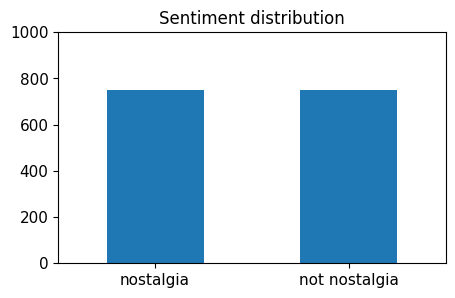

In [257]:
#plot the distributions of categories

print(df.sentiment.value_counts())

# plot barchart for X
df.sentiment.value_counts().plot(kind = 'bar',
                                 title = 'Sentiment distribution',
                                 ylim = [0, 1000],
                                 rot = 0, fontsize = 11, figsize = (5, 3))

not nostalgia    510
nostalgia        490
Name: sentiment, dtype: int64


<AxesSubplot:title={'center':'Sentiment distribution'}>

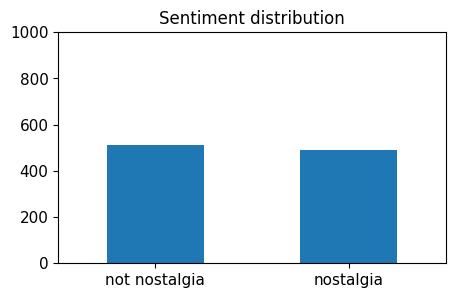

In [258]:
#plot the distributions of categories in sample

print(df_sample.sentiment.value_counts())

# plot barchart for X
df_sample.sentiment.value_counts().plot(kind = 'bar',
                                        title = 'Sentiment distribution',
                                        ylim = [0, 1000],
                                        rot = 0, fontsize = 11, figsize = (5, 3))

not nostalgia    510
nostalgia        490
Name: sentiment, dtype: int64


<AxesSubplot:title={'center':'Category distribution'}>

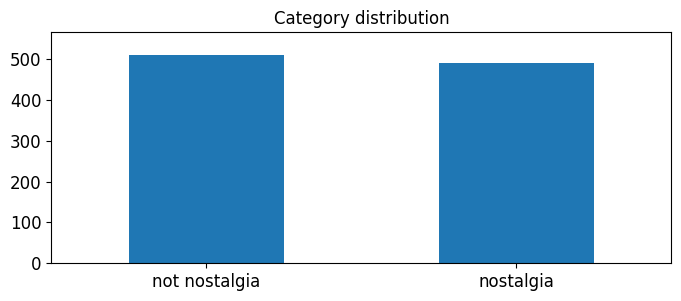

In [259]:
#automation of limits, nicer visualization
upper_bound = max(df_sample.sentiment.value_counts() + 55)
print(df_sample.sentiment.value_counts())

# plot barchart for X_sample
df_sample.sentiment.value_counts().plot(kind = 'bar',
                                        title = 'Category distribution',
                                        ylim = [0, upper_bound],
                                        rot = 0, fontsize = 12, figsize = (8,3))

<AxesSubplot:title={'center':'Sentiment distribution'}>

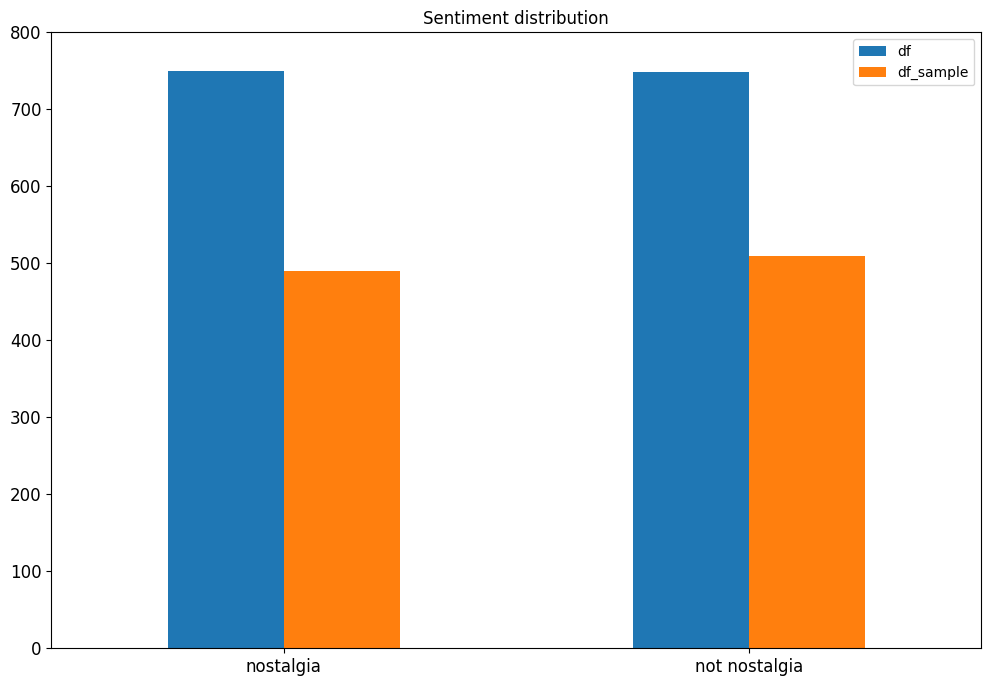

In [260]:
#side-by-side comparison of the distribution between the two datasets

df_sentiments = df['sentiment'].value_counts()
df_sample_sentiments = df_sample['sentiment'].value_counts()

combined_df = pd.DataFrame({'df': df_sentiments,'df_sample': df_sample_sentiments}) 

combined_df.plot(kind = 'bar',
                 title = 'Sentiment distribution',
                 ylim = [0, 800], 
                 rot = 0, fontsize = 12, figsize = (12,8))

In [261]:
#feature creation
# takes a like a minute or two to process
df['unigrams'] = df['comment'].apply(lambda x: dmh.tokenize_text(x))

In [263]:
df[0:4]["unigrams"]

0    [He, was, a, singer, with, a, golden, voice, t...
1    [The, mist, beautiful, voice, ever, I, listene...
2    [I, have, most, of, Mr., Reeves, songs, ., Alw...
3    [30, day, leave, from, 1st, tour, in, Viet, Na...
Name: unigrams, dtype: object

In [264]:
list(df[0:1]['unigrams'])

[['He',
  'was',
  'a',
  'singer',
  'with',
  'a',
  'golden',
  'voice',
  'that',
  'I',
  'love',
  'to',
  'hear',
  'all',
  'the',
  'time',
  '.',
  'I',
  'was',
  'his',
  'great',
  'fan',
  'at',
  'the',
  'age',
  'of',
  '16years',
  'in',
  'those',
  'days',
  'and',
  'still',
  'now',
  '.',
  'Although',
  'we',
  'have',
  'many',
  'singers',
  'now',
  ',',
  'but',
  ',',
  'I',
  'can',
  'vouch',
  'for',
  'Jim',
  'Reeves',
  'all',
  'the',
  'time',
  '.',
  'You',
  'feel',
  'relaxed',
  ',',
  'emotional',
  'and',
  'loving',
  '.',
  'Thank',
  'you',
  'Lord',
  'for',
  'his',
  'life',
  '.']]

In [266]:
#feature subset selection

from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer()
df_counts = count_vect.fit_transform(df.comment) #learn the vocabulary and return document-term matrix
print(df_counts[0])

  (0, 1598)	1
  (0, 3570)	2
  (0, 2973)	1
  (0, 3650)	1
  (0, 1470)	1
  (0, 3534)	1
  (0, 3282)	1
  (0, 2028)	1
  (0, 3336)	1
  (0, 1606)	1
  (0, 233)	2
  (0, 3284)	3
  (0, 3328)	2
  (0, 1651)	2
  (0, 1512)	1
  (0, 1249)	1
  (0, 323)	1
  (0, 214)	1
  (0, 2341)	1
  (0, 15)	1
  (0, 1733)	1
  (0, 3304)	1
  (0, 907)	1
  (0, 258)	2
  (0, 3124)	1
  (0, 2328)	2
  (0, 245)	1
  (0, 3581)	1
  (0, 1591)	1
  (0, 2082)	1
  (0, 2974)	1
  (0, 573)	1
  (0, 593)	1
  (0, 3538)	1
  (0, 1347)	2
  (0, 1833)	1
  (0, 2671)	1
  (0, 3713)	2
  (0, 1272)	1
  (0, 2688)	1
  (0, 1125)	1
  (0, 2035)	1
  (0, 3278)	1
  (0, 2018)	1
  (0, 1964)	1


In [271]:
count_vect.get_feature_names_out()[589]

'came'

In [275]:
#analyze the first record of our dataframe
analyze = count_vect.build_analyzer()
analyze(df.comment[0])

['he',
 'was',
 'singer',
 'with',
 'golden',
 'voice',
 'that',
 'love',
 'to',
 'hear',
 'all',
 'the',
 'time',
 'was',
 'his',
 'great',
 'fan',
 'at',
 'the',
 'age',
 'of',
 '16years',
 'in',
 'those',
 'days',
 'and',
 'still',
 'now',
 'although',
 'we',
 'have',
 'many',
 'singers',
 'now',
 'but',
 'can',
 'vouch',
 'for',
 'jim',
 'reeves',
 'all',
 'the',
 'time',
 'you',
 'feel',
 'relaxed',
 'emotional',
 'and',
 'loving',
 'thank',
 'you',
 'lord',
 'for',
 'his',
 'life']

In [276]:
# We can check the shape of this matrix by:
df_counts.shape

(1498, 3730)

In [283]:
count_vect.get_feature_names_out()[0:16]

array(['00', '000', '045', '07', '10', '100', '10m', '11', '11th', '12',
       '13', '14', '15', '150', '16', '16years'], dtype=object)

In [278]:
# we convert from sparse array to normal array
df_counts[0:5, 0:100].toarray()

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0,

In [281]:
for i, z in enumerate(df_counts[0:5, 0:100].toarray()):
    for j, value in enumerate(z):
        if value == 1:
            print(count_vect.get_feature_names_out()[j])

16years
17
1st
2nd
30


In [287]:
# first twenty features only
plot_x = ["term_"+str(i) for i in count_vect.get_feature_names_out()[0:20]]

In [288]:
# obtain document index
plot_y = ["comment_"+ str(i) for i in list(df.index)[0:20]]

In [289]:
plot_z = df_counts[0:20, 0:20].toarray() #X_counts[how many documents, how many terms]
plot_z

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0,

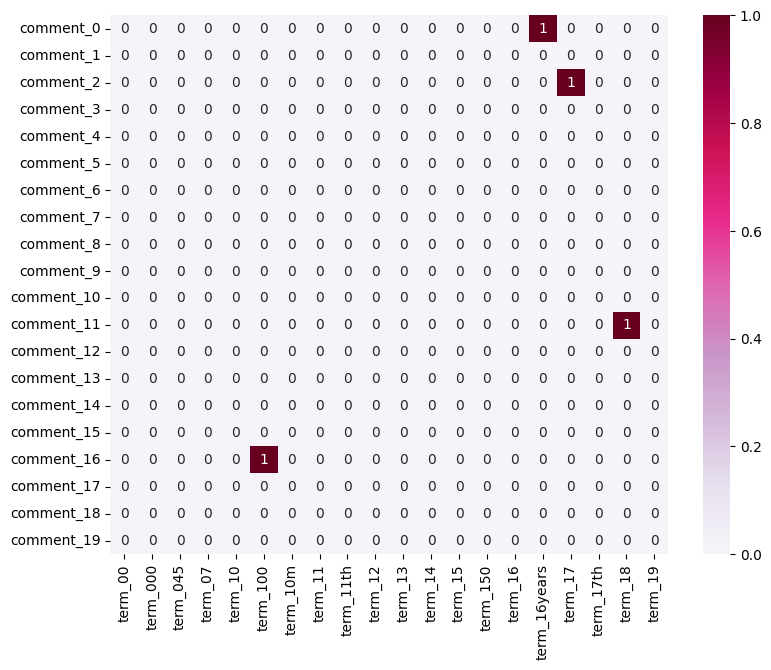

In [290]:
import seaborn as sns

df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(9, 7))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=1, annot=True)

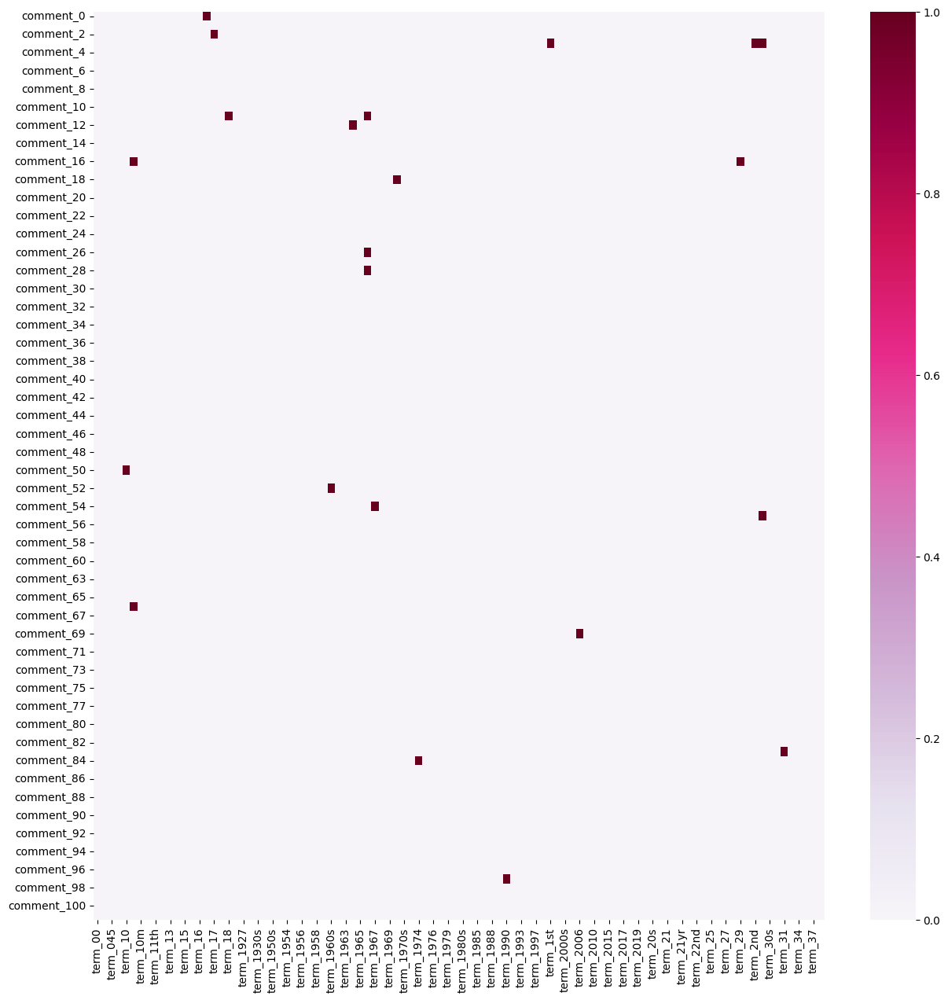

In [291]:
#firstly, I would try manually to increase the number of documents and see what it gives back

plot_x = ["term_"+str(i) for i in count_vect.get_feature_names_out()[0:100]]
plot_y = ["comment_"+ str(i) for i in list(df.index)[0:100]]
plot_z = df_counts[0:100, 0:100].toarray() 

#plotting more documents n=100 and more terms m=100

import seaborn as sns

df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(15, 15))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=1, annot=False)

(1498, 3730)


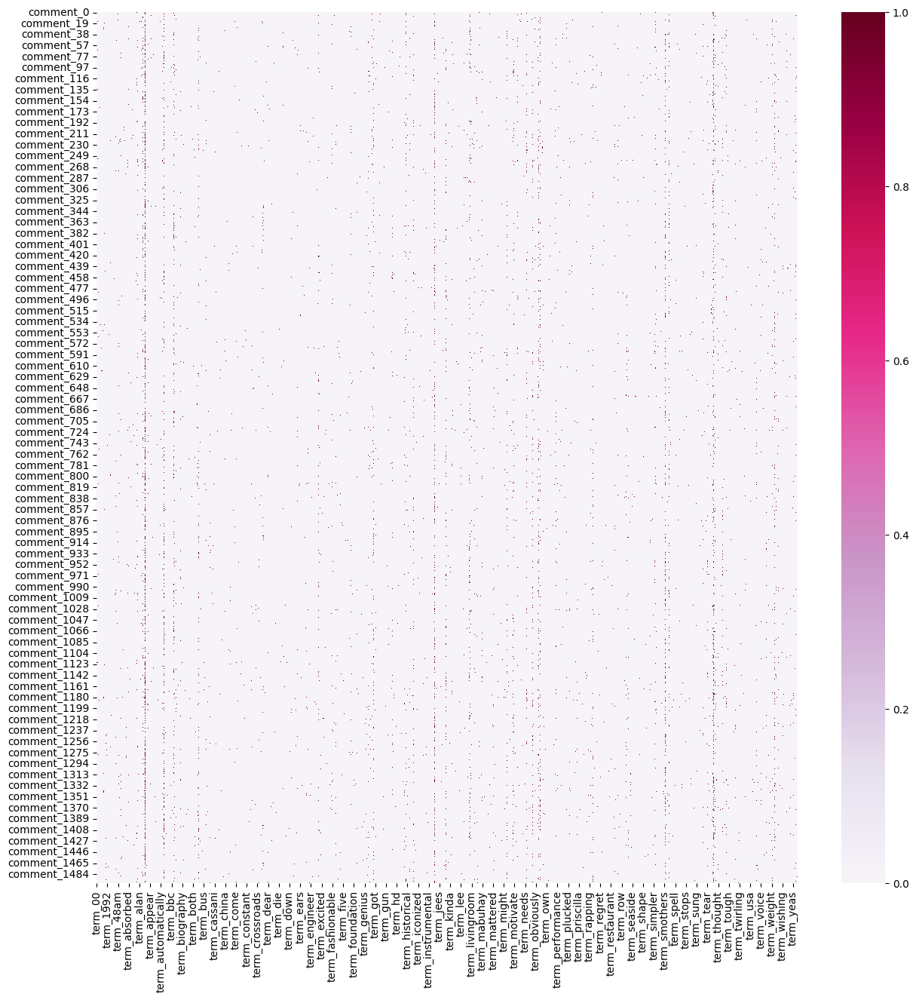

In [294]:
#then, I will see how much I can increase it in order to still see good visualization
plot_x = ["term_"+str(i) for i in count_vect.get_feature_names_out()]
plot_y = ["comment_"+ str(i) for i in list(df.index)]
plot_z = df_counts.toarray() 

#what is the final size of plot_z
print(plot_z.shape)

#it is not too big (1498, 3730)

import seaborn as sns

df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(15, 15))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=1, annot=False)

In [298]:
#attribute transformation
# note this takes time to compute. You may want to reduce the amount of terms you want to compute frequencies for
term_frequencies = []
for j in range(0,df_counts.shape[1]):
    term_frequencies.append(sum(df_counts[:,j].toarray()))

In [307]:
term_frequencies = np.asarray(df_counts.sum(axis=0))[0]

In [309]:
term_frequencies[0] 

1

C:\Users\JennisH\AppData\Local\Temp\ipykernel_14852\3480579971.py:4: UserWarning:

FixedFormatter should only be used together with FixedLocator



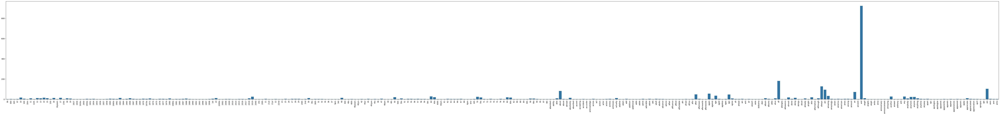

In [310]:
plt.subplots(figsize=(100, 10))
g = sns.barplot(x=count_vect.get_feature_names_out()[:300], 
            y=term_frequencies[:300])
g.set_xticklabels(count_vect.get_feature_names_out()[:300], rotation = 90);

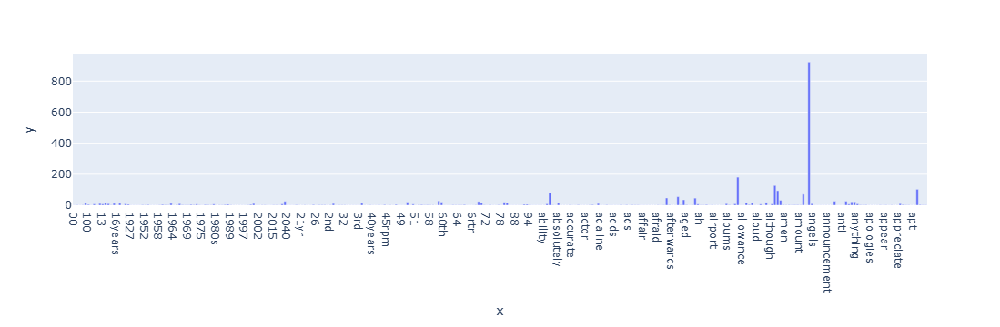

In [312]:
#better visualization with plotly
#using plotly
#resulted that and is the most frequent word
import plotly.express as px

# seems like we need to create a df first for using plotly
x = count_vect.get_feature_names_out()[:300]
y = term_frequencies[:300]

plotly_df = pd.DataFrame(x,y)

fig = px.bar(plotly_df,x,y)

fig.show()

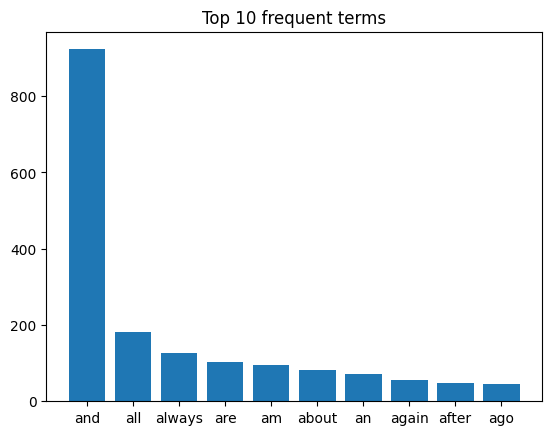

In [315]:
# more efficient might be to plot top 10 frequent terms

x = count_vect.get_feature_names_out()[:300]
y = term_frequencies[:300]

new_df = pd.DataFrame({'Term': x,'Frequency': y})

df_new = new_df.sort_values(by="Frequency", ascending=False)

df_new = df_new.head(10)

plt.bar(df_new['Term'], df_new['Frequency']) 

plt.title("Top 10 frequent terms")
plt.show()

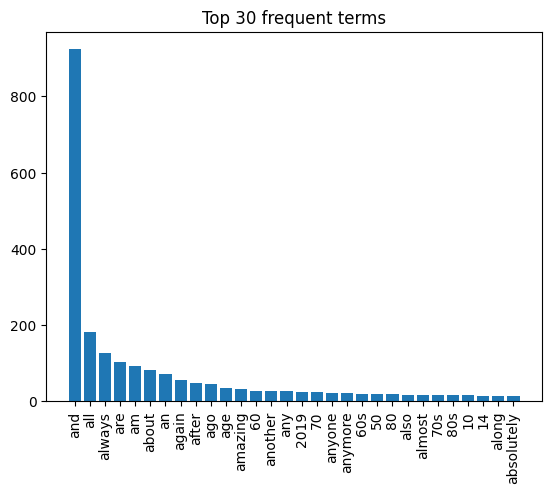

In [316]:
# might need top 30 for more information

x = count_vect.get_feature_names_out()[:300]
y = term_frequencies[:300]

new_df = pd.DataFrame({'Term': x,'Frequency': y})

df_new = new_df.sort_values(by="Frequency", ascending=False)

df_new = df_new.head(30)

plt.bar(df_new['Term'], df_new['Frequency']) 

#because now is more than 10, we need to rotate ticks for a better graph
plt.xticks(rotation=90)

plt.title("Top 30 frequent terms")
plt.show()

In [317]:
#log transformation
import math
term_frequencies_log = [math.log(i) for i in term_frequencies]

C:\Users\JennisH\AppData\Local\Temp\ipykernel_14852\2166548998.py:4: UserWarning:

FixedFormatter should only be used together with FixedLocator



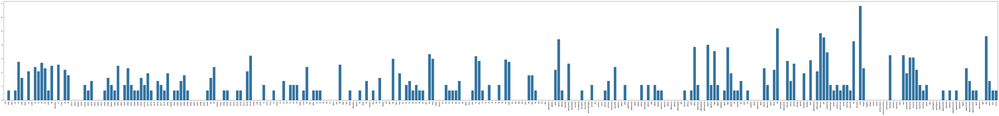

In [318]:
plt.subplots(figsize=(100, 10))
g = sns.barplot(x=count_vect.get_feature_names_out()[:300],
                y=term_frequencies_log[:300])
g.set_xticklabels(count_vect.get_feature_names_out()[:300], rotation = 90);

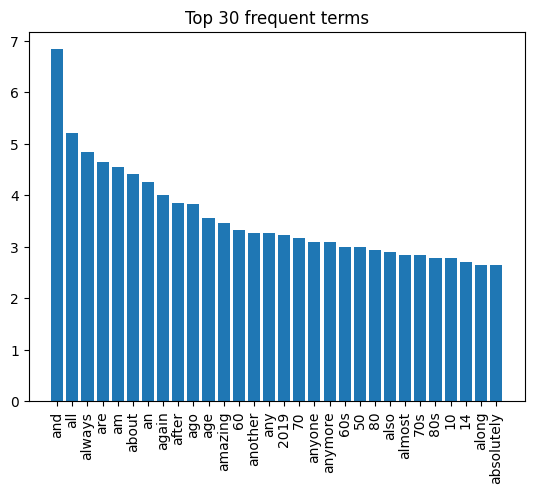

In [319]:
# might need top 30 for seeing a longer tail

x = count_vect.get_feature_names_out()[:300]
y = term_frequencies_log[:300]


new_df = pd.DataFrame({'Term': x,'Frequency': y})

df_new = new_df.sort_values(by="Frequency", ascending=False)

df_new = df_new.head(30)

plt.bar(df_new['Term'], df_new['Frequency']) 

#because now is more than 10, we need to rotate ticks for a better graph
plt.xticks(rotation=90)

plt.title("Top 30 frequent terms")
plt.show()

In [320]:
#find frequent patterns

import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

#Create separate DataFrames for each category
categories = df['sentiment'].unique()  # Get unique category labels
category_dfs = {}  # Dictionary to store DataFrames for each category

for category in categories:
    # Filter the original DataFrame by category
    category_dfs[category] = df[df['sentiment'] == category].copy()

# Function to create term-document frequency DataFrame for each category
def create_term_document_df(term_document_df_df):
    count_vect = CountVectorizer()  # Initialize the CountVectorizer
    df_counts = count_vect.fit_transform(term_document_df_df['comment'])  # Transform the text data into word counts
    
    # Get the unique words (vocabulary) from the vectorizer
    words = count_vect.get_feature_names_out()
    
    # Create a DataFrame where rows are documents and columns are words
    term_document_df = pd.DataFrame(df_counts.toarray(), columns=words)
    
    return term_document_df

# Create term-document frequency DataFrames for each category
filt_term_document_dfs = {}  # Dictionary to store term-document DataFrames for each category

for category in categories:
    filt_term_document_dfs[category] = create_term_document_df(category_dfs[category])

In [321]:
# Display the filtered DataFrame for one of the categories, feel free to change the number in the vector
category_number=0 #You can change it from 0 to 1
print(f"Filtered Term-Document Frequency DataFrame for Category {categories[category_number]}:")
filt_term_document_dfs[categories[category_number]]

Filtered Term-Document Frequency DataFrame for Category not nostalgia:


,00,000,045,10,100,10m,11,12,14,15,...,youngest,youngsters,your,yourself,youth,youtube,yrs,yuo,zealand,zulus
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
743,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
744,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
745,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
746,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


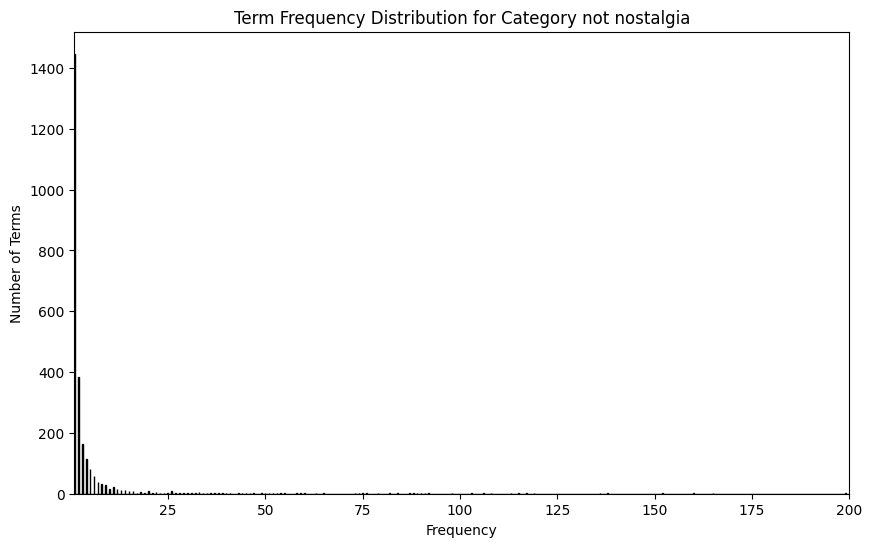

In [322]:
 # Sum over all documents to get total frequency for each word
category_number=0 #You can change it from 0 to 1
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()
 
# Visualize the frequency distribution
plt.figure(figsize=(10, 6))
plt.hist(word_counts, bins=5000, color='blue', edgecolor='black')
plt.title(f'Term Frequency Distribution for Category {categories[category_number]}')
plt.xlabel('Frequency')
plt.ylabel('Number of Terms')
plt.xlim(1, 200)
plt.show()

In [323]:
category_number=0 #You can change it from 0 to 1
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()

# Sort the term frequencies in descending order
sorted_indices = np.argsort(word_counts)[::-1]  # Get indices of sorted frequencies
sorted_counts = np.sort(word_counts)[::-1]  # Sort frequencies in descending order

# Calculate the index corresponding to the top 5% most frequent terms
total_terms = len(sorted_counts)
top_5_percent_index = int(0.05 * total_terms)

# Get the indices of the top 5% most frequent terms
top_5_percent_indices = sorted_indices[:top_5_percent_index]

# Filter terms that belong to the top 5% based on their rank
filtered_words = [filt_term_document_dfs[categories[category_number]].iloc[:, i].name for i in top_5_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in top 5%: {top_5_percent_index}")
print(f"Filtered terms: {filtered_words}")


Category: not nostalgia
Number of terms in top 5%: 130
Filtered terms: ['the', 'this', 'and', 'to', 'of', 'song', 'it', 'is', 'in', 'you', 'that', 'my', 'love', 'music', 'was', 'for', 'so', 'have', 'one', 'like', 'but', 'he', 'with', 'great', 'all', 'on', 'not', 'be', 'what', 'can', 'me', 'voice', 'just', 'as', 'songs', 'beautiful', 'her', 'time', 'she', 'will', 'they', 'when', 'from', 'his', 'at', 'are', 'always', 'good', 'no', 'know', 'now', 'much', 'about', 'never', 'who', 'really', 'if', 'we', 'more', 'best', 'ever', 'by', 'thank', 'think', 'would', 'only', 'how', 'don', 'still', 'has', 'very', 'there', 'am', 'out', 'him', 'these', 'could', 'up', 'old', 'hear', 'do', 'listen', 'singer', 'an', 'had', 'many', 'here', 'such', 'version', 'too', 'today', 'been', 'most', 'get', 'your', 'people', 'world', 'man', 'video', 'some', 'heard', 'sing', 'listening', 'real', 'years', 'were', 'than', 'singing', 'heart', 'nice', 'their', 'better', 'life', 'day', 'its', 'then', 'way', 'sad', 'those',

In [324]:
sorted_counts #We can see the frequencies sorted in a descending order

array([708, 451, 451, ...,   1,   1,   1], dtype=int64)

In [325]:
sorted_indices #This are the indices corresponding to the words after being sorted in a descending order

array([2276, 2290,  160, ..., 1509, 1510,    0], dtype=int64)

In [326]:
filt_term_document_dfs[categories[category_number]].loc[:,'the'].sum(axis=0) #Here we can sum up the column corresponding to the top 5% words, we just specify which one first.

708

In [328]:
category_number=0 #You can change it from 0 to 1
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()

# Sort the term frequencies in ascending order and get sorted indices
sorted_indices = np.argsort(word_counts)  # Get indices of sorted frequencies
sorted_counts = word_counts[sorted_indices]  # Sort frequencies

# Calculate the index corresponding to the bottom 1% least frequent terms
total_terms = len(sorted_counts)
bottom_1_percent_index = int(0.01 * total_terms)

# Get the indices of the bottom 1% least frequent terms
bottom_1_percent_indices = sorted_indices[:bottom_1_percent_index]

# Filter terms that belong to the bottom 1% based on their rank
filtered_words = [filt_term_document_dfs[categories[category_number]].iloc[:, i].name for i in bottom_1_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in bottom 1%: {bottom_1_percent_index}")
print(f"Filtered terms: {filtered_words}")


Category: not nostalgia
Number of terms in bottom 1%: 26
Filtered terms: ['00', 'montgomery', 'money', 'monday', 'moments', 'mocking', 'mock', 'mitch', 'misunderstood', 'minute', 'minds', 'miller', 'monumental', 'millennium', 'miles', 'microphone', 'miami', 'meta', 'mess', 'merle', 'mendes', 'mended', 'melting', 'melt', 'melodica', 'milestone']


In [329]:
sorted_counts #We can see the frequencies sorted in an ascending order

array([  1,   1,   1, ..., 451, 451, 708], dtype=int64)

In [330]:
sorted_indices #This are the indices corresponding to the words after being sorted in an ascending order

array([   0, 1510, 1509, ...,  160, 2290, 2276], dtype=int64)

In [331]:
#filter
category_number=0 #You can change it from 0 to 1

# Filter the bottom 1% and top 5% words based on their sum across all documents
def filter_top_bottom_words_by_sum(term_document_df, top_percent=0.05, bottom_percent=0.01):
    # Calculate the sum of each word across all documents
    word_sums = term_document_df.sum(axis=0)
    
    # Sort the words by their total sum
    sorted_words = word_sums.sort_values()
    
    # Calculate the number of words to remove
    total_words = len(sorted_words)
    top_n = int(top_percent * total_words)
    bottom_n = int(bottom_percent * total_words)
    
    # Get the words to remove from the top 5% and bottom 1%
    words_to_remove = pd.concat([sorted_words.head(bottom_n), sorted_words.tail(top_n)]).index
    print(f'Bottom {bottom_percent*100}% words: \n{sorted_words.head(bottom_n)}') #Here we print which words correspond to the bottom percentage we filter
    print(f'Top {top_percent*100}% words: \n{sorted_words.tail(top_n)}') #Here we print which words correspond to the top percentage we filter
    # Return the DataFrame without the filtered words
    return term_document_df.drop(columns=words_to_remove)

# Apply the filtering function to each category
term_document_dfs = {}

for category in categories:
    print(f'\nFor category {category} we filter the following words:')
    term_document_dfs[category] = filter_top_bottom_words_by_sum(filt_term_document_dfs[category])

# Example: Display the filtered DataFrame for one of the categories
print(f"Filtered Term-Document Frequency DataFrame for Category {categories[category_number]}:")
term_document_dfs[categories[category_number]]



For category not nostalgia we filter the following words:
Bottom 1.0% words: 
00               1
montgomery       1
money            1
monday           1
moments          1
mocking          1
mock             1
mitch            1
misunderstood    1
minute           1
minds            1
miller           1
monumental       1
millennium       1
miles            1
microphone       1
miami            1
meta             1
mess             1
merle            1
mendes           1
mended           1
melting          1
melt             1
melodica         1
milestone        1
dtype: int64
Top 5.0% words: 
classic     23
got         23
first       23
wish        24
any         25
          ... 
of         361
to         394
and        451
this       451
the        708
Length: 130, dtype: int64

For category nostalgia we filter the following words:
Bottom 1.0% words: 
yup            1
gospel         1
rose           1
round          1
rousing        1
goodness       1
routine        1
row         

,000,045,10,100,10m,11,12,14,15,150,...,younger,youngest,youngsters,yourself,youth,youtube,yrs,yuo,zealand,zulus
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
743,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
744,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
745,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
746,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [332]:
# I had modified the code, so that i can actually see all of the words for the fair comparison

category_number=0 #You can change it from 0 to 1

# Filter the bottom 1% and top 5% words based on their sum across all documents
def filter_top_bottom_words_by_sum(term_document_df, top_percent=0.05, bottom_percent=0.01):
    # Calculate the sum of each word across all documents
    word_sums = term_document_df.sum(axis=0)
    
    # Sort the words by their total sum
    sorted_words = word_sums.sort_values()
    
    # Calculate the number of words to remove
    total_words = len(sorted_words)
    top_n = int(top_percent * total_words)
    bottom_n = int(bottom_percent * total_words)
    
    bottom_words = sorted_words.head(bottom_n).index.tolist()
    top_words = sorted_words.tail(top_n).index.tolist()
    
    # modified - display all rows
    pd.set_option('display.max_rows', None)
    
    #modified
    print(f'Bottom {bottom_percent*100}% words: \n{bottom_words}')  
    print(f'Top {top_percent*100}% words: \n{top_words}')

    #turn off display all rows
    pd.reset_option('display.max_rows')
    
    # Return the DataFrame without the filtered words
    return term_document_df.drop(columns=bottom_words + top_words)

# Apply the filtering function to each category
term_document_dfs = {}

for category in categories:
    print(f'\nFor category {category} we filter the following words:')
    term_document_dfs[category] = filter_top_bottom_words_by_sum(filt_term_document_dfs[category])

# Example: Display the filtered DataFrame for one of the categories
print(f"Filtered Term-Document Frequency DataFrame for Category {categories[category_number]}:")
term_document_dfs[categories[category_number]]





For category not nostalgia we filter the following words:
Bottom 1.0% words: 
['00', 'montgomery', 'money', 'monday', 'moments', 'mocking', 'mock', 'mitch', 'misunderstood', 'minute', 'minds', 'miller', 'monumental', 'millennium', 'miles', 'microphone', 'miami', 'meta', 'mess', 'merle', 'mendes', 'mended', 'melting', 'melt', 'melodica', 'milestone']
Top 5.0% words: 
['classic', 'got', 'first', 'wish', 'any', 'make', 'or', 'why', 'come', 'god', 'did', 'those', 'sad', 'way', 'then', 'its', 'day', 'life', 'better', 'their', 'nice', 'heart', 'singing', 'than', 'were', 'years', 'real', 'listening', 'sing', 'heard', 'some', 'video', 'man', 'world', 'people', 'your', 'get', 'most', 'been', 'today', 'too', 'version', 'such', 'here', 'many', 'had', 'an', 'singer', 'listen', 'do', 'hear', 'old', 'up', 'could', 'these', 'him', 'out', 'am', 'there', 'very', 'has', 'still', 'don', 'how', 'only', 'would', 'think', 'thank', 'by', 'ever', 'best', 'more', 'we', 'if', 'really', 'who', 'never', 'about',

,000,045,10,100,10m,11,12,14,15,150,...,younger,youngest,youngsters,yourself,youth,youtube,yrs,yuo,zealand,zulus
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
743,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
744,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
745,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
746,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [338]:
#from PAMI.extras.DF2DB import DenseFormatDF as db      #Uncomment this line and comment the line below if this block of code 
                                                        #gives you trouble
from PAMI.extras.convert.DF2DB import DF2DB            

# Loop through the dictionary of term-document DataFrames
for category in term_document_dfs:
    # Replace dots with underscores in the category name to avoid errors in the file creation
    category_safe = category.replace('.', '_')
    
    # Create the DenseFormatDF object and convert to a transactional database
    #obj = db.DenseFormatDF(term_document_dfs[category]) #Uncomment this line and comment the line below if this block of code 
                                                         #gives you trouble
    obj = DF2DB(term_document_dfs[category])           
        
    obj.convert2TransactionalDatabase(f'td_freq_db_{category_safe}.csv', '>=', 1)

Database size (total no of transactions) : 734
Number of items : 2159
Minimum Transaction Size : 1
Average Transaction Size : 8.693460490463215
Maximum Transaction Size : 39
Standard Deviation Transaction Size : 7.213372063492091
Variance in Transaction Sizes : 52.103722524357735
Sparsity : 0.9959733855996001


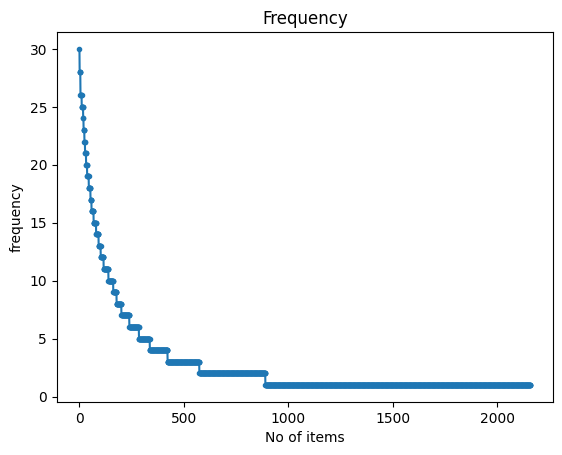

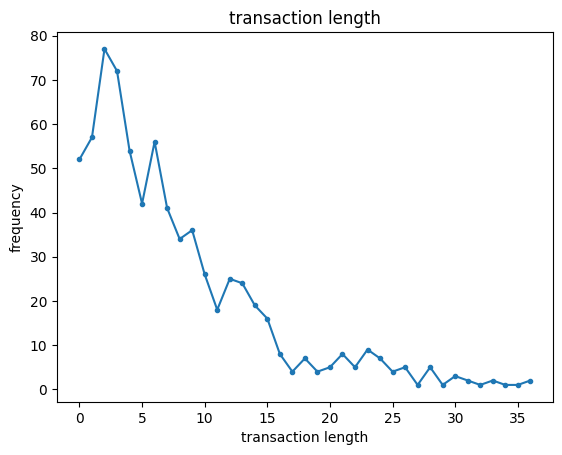

In [339]:
from PAMI.extras.dbStats import TransactionalDatabase as tds
obj = tds.TransactionalDatabase('td_freq_db_nostalgia.csv')
obj.run()
obj.printStats()
obj.plotGraphs()

Database size (total no of transactions) : 744
Number of items : 2446
Minimum Transaction Size : 1
Average Transaction Size : 8.416666666666666
Maximum Transaction Size : 46
Standard Deviation Transaction Size : 5.952413594380544
Variance in Transaction Sizes : 35.47891431135038
Sparsity : 0.996559007904061


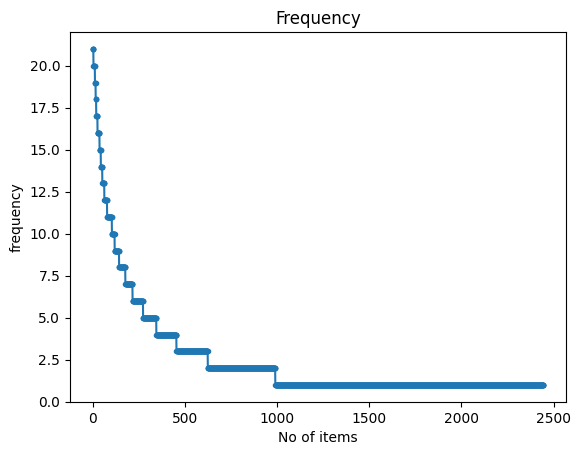

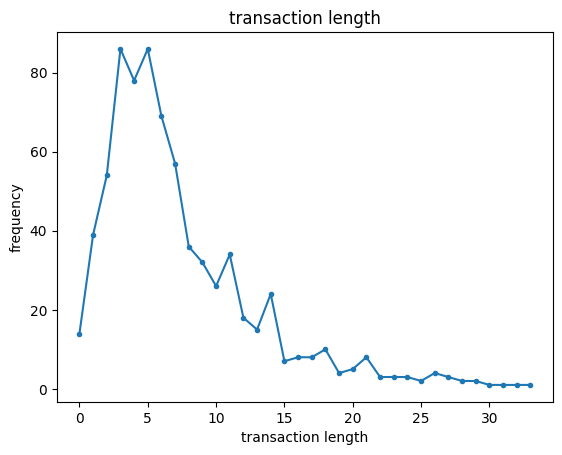

In [340]:
from PAMI.extras.dbStats import TransactionalDatabase as tds
obj = tds.TransactionalDatabase('td_freq_db_not nostalgia.csv')
obj.run()
obj.printStats()
obj.plotGraphs()

In [343]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj1 = alg.FPGrowth(iFile='td_freq_db_nostalgia.csv', minSup=minSup)
obj1.mine()
frequentPatternsDF_nostalgia= obj1.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_nostalgia))) #print the total number of patterns
print('Runtime: ' + str(obj1.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 180
Runtime: 0.010004997253417969


In [344]:
obj1.save('frequentPatternsDF_nostalgia.txt') #save the patterns
frequentPatternsDF_nostalgia

,Patterns,Support
0,find,9
1,down,9
2,few,9
3,its,9
4,sure,9
...,...,...
175,ever,28
176,would,28
177,will,28
178,go,28


In [345]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj1 = alg.FPGrowth(iFile='td_freq_db_not nostalgia.csv', minSup=minSup)
obj1.mine()
frequentPatternsDF_not_nostalgia= obj1.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_not_nostalgia))) #print the total number of patterns
print('Runtime: ' + str(obj1.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 144
Runtime: 0.00903010368347168


In [346]:
obj2.save('frequentPatternsDF_not_nostalgia.txt') #save the patterns
frequentPatternsDF_not_nostalgia

,Patterns,Support
0,favorites,9
1,special,9
2,soul,9
3,mind,9
4,60,9
...,...,...
139,elvis,21
140,every,21
141,loved,21
142,them,21


In [347]:
#focus on unique patterns 

pattern_dataframes = [frequentPatternsDF_nostalgia, frequentPatternsDF_not_nostalgia]

# Identify patterns that appear in more than one category
# Count how many times each pattern appears across all DataFrames
pattern_counts = {}
for pattern_df in pattern_dataframes:
    for pattern in pattern_df['Patterns']:
        if pattern not in pattern_counts:
            pattern_counts[pattern] = 1
        else:
            pattern_counts[pattern] += 1

# Filter out patterns that appear in more than one DataFrame
unique_patterns = {pattern for pattern, count in pattern_counts.items() if count == 1}

# Calculate the total number of patterns across all categories
total_patterns_count = sum(len(pattern_df) for pattern_df in pattern_dataframes)

# Calculate how many patterns were discarded
discarded_patterns_count = total_patterns_count - len(unique_patterns)

# For each category, filter the patterns to keep only the unique ones
filtered_pattern_dataframes = []
for pattern_df in pattern_dataframes:
    filtered_pattern_df = pattern_df[pattern_df['Patterns'].isin(unique_patterns)]
    filtered_pattern_dataframes.append(filtered_pattern_df)

# Merge the filtered DataFrames into a final DataFrame
final_unique_patterns_df = pd.concat(filtered_pattern_dataframes, ignore_index=True)

# Sort by support
final_unique_patterns_df = final_unique_patterns_df.sort_values(by='Support', ascending=False)

# Display the final result
print(final_unique_patterns_df)

# Print the number of discarded patterns
print(f"Number of patterns discarded: {discarded_patterns_count}")


     Patterns  Support
127      will       28
126     would       28
125      ever       28
123        or       26
120       kid       26
..        ...      ...
142  handsome        9
143   perfect        9
144        ll        9
145     happy        9
0         its        9

[220 rows x 2 columns]
Number of patterns discarded: 104


In [348]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

# Convert 'text' column into term-document matrix using CountVectorizer
count_vect = CountVectorizer()
X_tdm = count_vect.fit_transform(df['comment'])  # (df['comment']) contains your text data
terms = count_vect.get_feature_names_out()  # Original terms in the vocabulary

# Tokenize the sentences into sets of unique words
df['tokenized_text'] = df['comment'].str.split().apply(set)

# Initialize the pattern matrix
pattern_matrix = pd.DataFrame(0, index=df.index, columns=final_unique_patterns_df['Patterns'])

# Iterate over each pattern and check if all words in the pattern are present in the tokenized sentence
for pattern in final_unique_patterns_df['Patterns']:
    pattern_words = set(pattern.split())  # Tokenize pattern into words
    pattern_matrix[pattern] = df['tokenized_text'].apply(lambda x: 1 if pattern_words.issubset(x) else 0)

# Convert the term-document matrix to a DataFrame for easy merging
tdm_df = pd.DataFrame(X_tdm.toarray(), columns=terms, index=df.index)

# Concatenate the original TDM and the pattern matrix to augment the features
augmented_df = pd.concat([tdm_df, pattern_matrix], axis=1)

augmented_df

,00,000,045,07,10,100,10m,11,11th,12,...,please,though,wonder,person,sung,handsome,perfect,ll,happy,its
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1496,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1497,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1498,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [349]:
from PAMI.frequentPattern.topk import FAE  as alg

inputFile = 'td_freq_db_nostalgia.csv'

kCount=500  #Users can also specify this constraint between 0 to 1.

seperator='\t'


obj = alg.FAE(iFile=inputFile, k=kCount, sep=seperator)    #initialize
obj.mine()            #Start the mining process

obj.save(outFile='frequentPatternsMinSupCount500.txt')
frequentPatternsDF= obj.getPatternsAsDataFrame()

print('Total No of patterns: ' + str(len(frequentPatternsDF)))
print('Runtime: ' + str(obj.getRuntime()))
print('Memory (RSS): ' + str(obj.getMemoryRSS()))
print('Memory (USS): ' + str(obj.getMemoryUSS()))

frequentPatternsDF

 TopK frequent patterns were successfully generated using FAE algorithm.
Total No of patterns: 500
Runtime: 0.09299969673156738
Memory (RSS): 561885184
Memory (USS): 401211392


,Patterns,Support
0,favorite,30
1,ever,28
2,would,28
3,will,28
4,go,28
...,...,...
495,don house,4
496,god bless,4
497,brenda lee,4
498,august,3


In [350]:
#try to do it through the code
from PAMI.frequentPattern.maximal import MaxFPGrowth  as alg #import the algorithm

obj = alg.MaxFPGrowth(iFile='td_freq_db_nostalgia.csv', minSup=3, sep='\t') #initialize
obj.mine()            #start the mining process

obj.save('maximalFrequentPatternsAtMinSupCount3.txt') #save the patterns

frequentPatternsDF= obj.getPatternsAsDataFrame() #get the generated frequent patterns as a dataframe
print('Total No of patterns: ' + str(len(frequentPatternsDF))) #print the total number of patterns
print('Runtime: ' + str(obj.getRuntime())) #measure the runtime

print('Memory (RSS): ' + str(obj.getMemoryRSS()))
print('Memory (USS): ' + str(obj.getMemoryUSS()))

frequentPatternsDF

Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns: 682
Runtime: 0.029999732971191406
Memory (RSS): 563187712
Memory (USS): 402522112


,Patterns,Support
0,skating,3
1,walker,3
2,scott,3
3,17 1987,3
4,stop,3
...,...,...
677,will such,4
678,ever only,3
679,would only,4
680,ever kid,3


In [355]:
#reduce the dimensions
#Applying dimensionality reduction with only the document-term frequency data
import numpy as np
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import matplotlib.pyplot as plt

#This might take a couple of minutes to execute
# Apply PCA, t-SNE, and UMAP to the data
df_pca_tdm = PCA(n_components=2).fit_transform(tdm_df.values)
df_tsne_tdm = TSNE(n_components=2).fit_transform(tdm_df.values)
df_umap_tdm = umap.UMAP(n_components=2).fit_transform(tdm_df.values)

C:\Users\JennisH\AppData\Roaming\Python\Python39\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\JennisH\AppData\Roaming\Python\Python39\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



In [356]:
df_pca_tdm.shape

(1498, 2)

In [357]:
df_tsne_tdm.shape

(1498, 2)

In [358]:
df_umap_tdm.shape

(1498, 2)

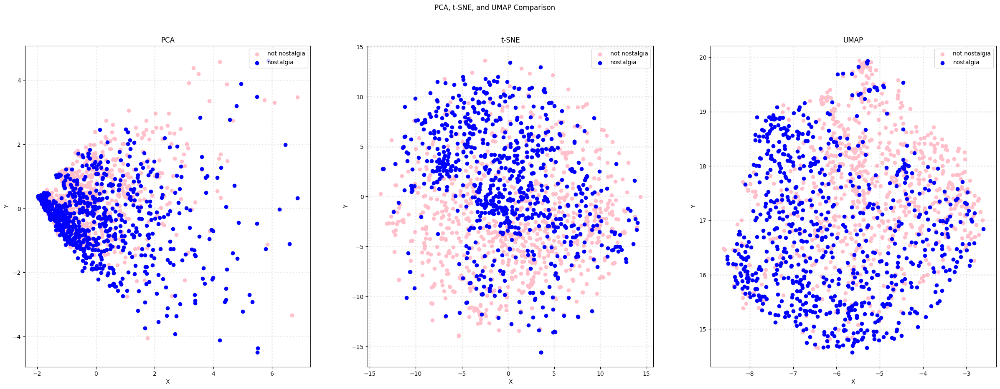

In [363]:
# Plot the results in subplots
col = ['pink', 'blue']
categories = df['sentiment'].unique() 

fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a scatter plot for each method
def plot_scatter(ax, df_reduced, title):
    for c, category in zip(col, categories):
        xs = df_reduced[df['sentiment'] == category].T[0]
        ys = df_reduced[df['sentiment'] == category].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

# Step 4: Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter(axes[0], df_pca_tdm, 'PCA')
plot_scatter(axes[1], df_tsne_tdm, 't-SNE')
plot_scatter(axes[2], df_umap_tdm, 'UMAP')

plt.show()

In [364]:
#This might take a couple of minutes to execute
#Applying dimensionality reduction with both the document-term frequency data and the pattern derived data
# Apply PCA, t-SNE, and UMAP to the data
df_pca_aug = PCA(n_components=2).fit_transform(augmented_df.values)
df_tsne_aug = TSNE(n_components=2).fit_transform(augmented_df.values)
df_umap_aug = umap.UMAP(n_components=2).fit_transform(augmented_df.values)

C:\Users\JennisH\AppData\Roaming\Python\Python39\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\JennisH\AppData\Roaming\Python\Python39\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



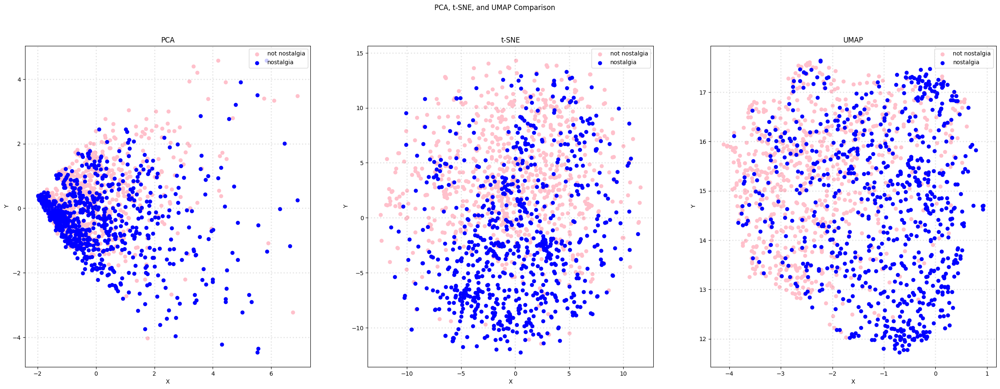

In [365]:
# Plot the results in subplots
col = ['pink', 'blue']
categories = df['sentiment'].unique() 

fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a scatter plot for each method
def plot_scatter(ax, df_reduced, title):
    for c, category in zip(col, categories):
        xs = df_reduced[df['sentiment'] == category].T[0]
        ys = df_reduced[df['sentiment'] == category].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

# Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter(axes[0], df_pca_aug, 'PCA')
plot_scatter(axes[1], df_tsne_aug, 't-SNE')
plot_scatter(axes[2], df_umap_aug, 'UMAP')

plt.show()

In [366]:
#3d plotting
df_pca_tdm = PCA(n_components=3).fit_transform(tdm_df.values)
df_tsne_tdm = TSNE(n_components=3).fit_transform(tdm_df.values)
df_umap_tdm = umap.UMAP(n_components=3).fit_transform(tdm_df.values)

C:\Users\JennisH\AppData\Roaming\Python\Python39\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\JennisH\AppData\Roaming\Python\Python39\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



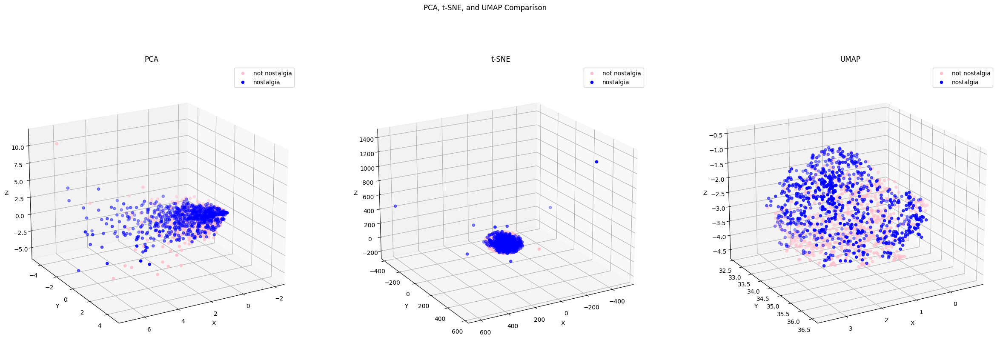

In [370]:
from mpl_toolkits.mplot3d import Axes3D 
import matplotlib.pyplot as plt

col = ['pink', 'blue']
categories = df['sentiment'].unique() 

fig = plt.figure(figsize=(30, 10)) 
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a 3D scatter plot for each method
def plot_scatter_for_three_dimensions(ax, df_reduced, title):
    for c, category in zip(col, categories):
        xs = df_reduced[df['sentiment'] == category].T[0]
        ys = df_reduced[df['sentiment'] == category].T[1]
        zs = df_reduced[df['sentiment'] == category].T[2]
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)
    
    ax.grid(color='black', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend(loc='upper right')

ax1 = fig.add_subplot(131, projection='3d')
ax2 = fig.add_subplot(132, projection='3d')
ax3 = fig.add_subplot(133, projection='3d')

plot_scatter_for_three_dimensions(ax1, df_pca_tdm, 'PCA')
plot_scatter_for_three_dimensions(ax2, df_tsne_tdm, 't-SNE')
plot_scatter_for_three_dimensions(ax3, df_umap_tdm, 'UMAP')

ax1.view_init(elev=20, azim=60)   
ax2.view_init(elev=20, azim=60)  
ax3.view_init(elev=20, azim=60)  

plt.show()

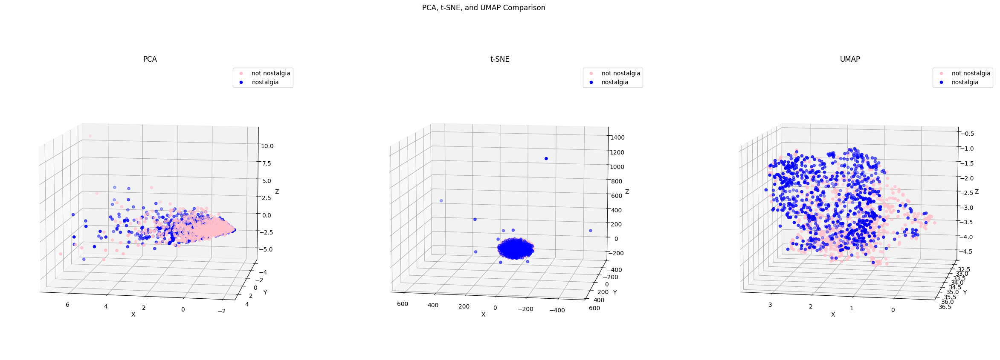

In [371]:
from mpl_toolkits.mplot3d import Axes3D 
import matplotlib.pyplot as plt

col = ['pink', 'blue']
categories = df['sentiment'].unique() 

fig = plt.figure(figsize=(30, 10)) 
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a 3D scatter plot for each method
def plot_scatter_for_three_dimensions(ax, df_reduced, title):
    for c, category in zip(col, categories):
        xs = df_reduced[df['sentiment'] == category].T[0]
        ys = df_reduced[df['sentiment'] == category].T[1]
        zs = df_reduced[df['sentiment'] == category].T[2]
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)
    
    ax.grid(color='black', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend(loc='upper right')

ax1 = fig.add_subplot(131, projection='3d')
ax2 = fig.add_subplot(132, projection='3d')
ax3 = fig.add_subplot(133, projection='3d')

plot_scatter_for_three_dimensions(ax1, df_pca_tdm, 'PCA')
plot_scatter_for_three_dimensions(ax2, df_tsne_tdm, 't-SNE')
plot_scatter_for_three_dimensions(ax3, df_umap_tdm, 'UMAP')

ax1.view_init(elev=10, azim=100)   
ax2.view_init(elev=10, azim=100)  
ax3.view_init(elev=10, azim=100)  

plt.show()

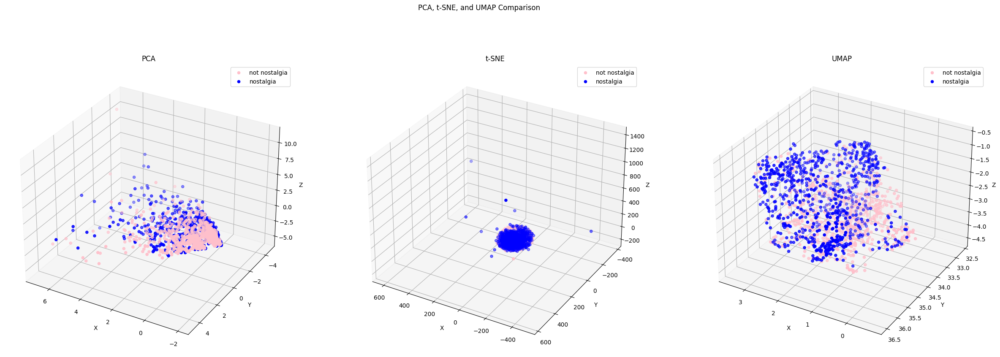

In [372]:
from mpl_toolkits.mplot3d import Axes3D 
import matplotlib.pyplot as plt

col = ['pink', 'blue']
categories = df['sentiment'].unique() 

fig = plt.figure(figsize=(30, 10)) 
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a 3D scatter plot for each method
def plot_scatter_for_three_dimensions(ax, df_reduced, title):
    for c, category in zip(col, categories):
        xs = df_reduced[df['sentiment'] == category].T[0]
        ys = df_reduced[df['sentiment'] == category].T[1]
        zs = df_reduced[df['sentiment'] == category].T[2]
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)
    
    ax.grid(color='black', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend(loc='upper right')

ax1 = fig.add_subplot(131, projection='3d')
ax2 = fig.add_subplot(132, projection='3d')
ax3 = fig.add_subplot(133, projection='3d')

plot_scatter_for_three_dimensions(ax1, df_pca_tdm, 'PCA')
plot_scatter_for_three_dimensions(ax2, df_tsne_tdm, 't-SNE')
plot_scatter_for_three_dimensions(ax3, df_umap_tdm, 'UMAP')

ax1.view_init(elev=30, azim=120)   
ax2.view_init(elev=30, azim=120)  
ax3.view_init(elev=30, azim=120)  

plt.show()

In [379]:
#discretization and binarization

from sklearn import preprocessing, metrics, decomposition, pipeline, dummy

In [380]:
mlb = preprocessing.LabelBinarizer()

In [381]:
mlb.fit(df.category)

LabelBinarizer()

In [382]:
df['bin_category'] = mlb.transform(df['category']).tolist()

In [383]:
df[0:9]

,sentiment,comment,category,unigrams,tokenized_text,bin_category
0,not nostalgia,He was a singer with a golden voice that I lov...,0,"[He, was, a, singer, with, a, golden, voice, t...","{hear, vouch, voice, Thank, those, relaxed,, t...",[0]
1,nostalgia,The mist beautiful voice ever I listened to hi...,1,"[The, mist, beautiful, voice, ever, I, listene...","{voice, angel, listened, The, forgotten, ever,...",[1]
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,1,"[I, have, most, of, Mr., Reeves, songs, ., Alw...","{loving, Mr., were, voice,, comforting, had, n...",[1]
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,0,"[30, day, leave, from, 1st, tour, in, Viet, Na...","{greatest, are, years, Thank, receive., man, b...",[0]
4,nostalgia,listening to his songs reminds me of my mum wh...,1,"[listening, to, his, songs, reminds, me, of, m...","{everyday, played, mum, to, songs, listening, ...",[1]
5,nostalgia,"Every time I heard this song as a child, I use...",1,"[Every, time, I, heard, this, song, as, a, chi...","{RIP, your, voice, that, souls., Jim, over, ma...",[1]
6,nostalgia,"My dad loved listening to Jim Reeves, when I w...",1,"[My, dad, loved, listening, to, Jim, Reeves, ,...","{listening, Jim, do, in, the, Time, didn't, lo...",[1]
7,nostalgia,i HAVE ALSO LISTENED TO Jim Reeves since child...,1,"[i, HAVE, ALSO, LISTENED, TO, Jim, Reeves, sin...","{., childhood, Jim, tunes, the, in, feeling, t...",[1]
8,not nostalgia,Wherever you are you always in my heart,0,"[Wherever, you, are, you, always, in, my, heart]","{Wherever, are, always, my, in, you, heart}",[0]


In [384]:
#data exploration
# We retrieve 3 sentences for a random record
document_to_transform_1 = []
random_record_1 = df.iloc[50]
random_record_1 = random_record_1['comment']
document_to_transform_1.append(random_record_1)

document_to_transform_2 = []
random_record_2 = df.iloc[100]
random_record_2 = random_record_2['comment']
document_to_transform_2.append(random_record_2)

document_to_transform_3 = []
random_record_3 = df.iloc[150]
random_record_3 = random_record_3['comment']
document_to_transform_3.append(random_record_3)

In [385]:
print(document_to_transform_1)
print(document_to_transform_2)
print(document_to_transform_3)

['If I remember correctly, this song came out after Mr. Reeves passed away. I was about 10 years old when the disc jockey said that the news just came over the wire that he died in a plane crash.']
['I love this song reminds me of the love of my life']
['TURN MY MEMORIES BACK IN 1993, TO LAURA FROM COMO, ITALIA, THANK YOU, THANK YOU, THANK YOU']


In [386]:
from sklearn.preprocessing import binarize

# Transform sentence with Vectorizers
document_vector_count_1 = count_vect.transform(document_to_transform_1)
document_vector_count_2 = count_vect.transform(document_to_transform_2)
document_vector_count_3 = count_vect.transform(document_to_transform_3)

# Binarize vectors to simplify: 0 for abscence, 1 for prescence
document_vector_count_1_bin = binarize(document_vector_count_1)
document_vector_count_2_bin = binarize(document_vector_count_2)
document_vector_count_3_bin = binarize(document_vector_count_3)

# print vectors
print("Let's take a look at the count vectors:")
print(document_vector_count_1.todense())
print(document_vector_count_2.todense())
print(document_vector_count_3.todense())

Let's take a look at the count vectors:
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]


In [387]:
from sklearn.metrics.pairwise import cosine_similarity

# Calculate Cosine Similarity
cos_sim_count_1_2 = cosine_similarity(document_vector_count_1, document_vector_count_2, dense_output=True)
cos_sim_count_1_3 = cosine_similarity(document_vector_count_1, document_vector_count_3, dense_output=True)
cos_sim_count_2_3 = cosine_similarity(document_vector_count_2, document_vector_count_3, dense_output=True)

cos_sim_count_1_1 = cosine_similarity(document_vector_count_1, document_vector_count_1, dense_output=True)
cos_sim_count_2_2 = cosine_similarity(document_vector_count_2, document_vector_count_2, dense_output=True)
cos_sim_count_3_3 = cosine_similarity(document_vector_count_3, document_vector_count_3, dense_output=True)

# Print 
print("Cosine Similarity using count bw 1 and 2: %(x)f" %{"x":cos_sim_count_1_2})
print("Cosine Similarity using count bw 1 and 3: %(x)f" %{"x":cos_sim_count_1_3})
print("Cosine Similarity using count bw 2 and 3: %(x)f" %{"x":cos_sim_count_2_3})

print("Cosine Similarity using count bw 1 and 1: %(x)f" %{"x":cos_sim_count_1_1})
print("Cosine Similarity using count bw 2 and 2: %(x)f" %{"x":cos_sim_count_2_2})
print("Cosine Similarity using count bw 3 and 3: %(x)f" %{"x":cos_sim_count_3_3})

Cosine Similarity using count bw 1 and 2: 0.190347
Cosine Similarity using count bw 1 and 3: 0.027379
Cosine Similarity using count bw 2 and 3: 0.047946
Cosine Similarity using count bw 1 and 1: 1.000000
Cosine Similarity using count bw 2 and 2: 1.000000
Cosine Similarity using count bw 3 and 3: 1.000000


In [389]:
#data classification
#Model with only the document-term frequency data
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score

# Create a mapping from numerical labels to category names
category_mapping = dict(df[['category', 'sentiment']].drop_duplicates().values)

# Convert the numerical category labels to text labels
target_names = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(tdm_df, df['category'], test_size=0.3, random_state=42)

In [390]:
X_train

,00,000,045,07,10,100,10m,11,11th,12,...,yours,yourself,youth,youthful,youtube,yrs,yuo,yup,zealand,zulus
890,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1397,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
709,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1273,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
940,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1132,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1296,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
862,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1461,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [391]:
X_test

,00,000,045,07,10,100,10m,11,11th,12,...,yours,yourself,youth,youthful,youtube,yrs,yuo,yup,zealand,zulus
1035,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1307,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1437,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1491,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
790,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1231,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
1275,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
484,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1329,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [392]:
# Train the Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8822222222222222

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.9463    0.8220    0.8798       236
    nostalgia     0.8286    0.9486    0.8845       214

     accuracy                         0.8822       450
    macro avg     0.8875    0.8853    0.8822       450
 weighted avg     0.8903    0.8822    0.8821       450



In [393]:
#Model with the augmented data
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score

# Create a mapping from numerical labels to category names
category_mapping = dict(df[['category', 'sentiment']].drop_duplicates().values)

# Convert the numerical category labels to text labels
target_names = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(augmented_df, df['sentiment'], test_size=0.3, random_state=42)

In [394]:
X_train

,00,000,045,07,10,100,10m,11,11th,12,...,please,though,wonder,person,sung,handsome,perfect,ll,happy,its
890,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1397,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
709,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1273,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
940,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1132,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1296,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
862,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1461,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [395]:
X_test

,00,000,045,07,10,100,10m,11,11th,12,...,please,though,wonder,person,sung,handsome,perfect,ll,happy,its
1035,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1307,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1437,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1491,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
790,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1231,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1275,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
484,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1329,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [396]:
# Train the Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8777777777777778

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.8326    0.9299    0.8786       214
    nostalgia     0.9289    0.8305    0.8770       236

     accuracy                         0.8778       450
    macro avg     0.8808    0.8802    0.8778       450
 weighted avg     0.8831    0.8778    0.8777       450



## The third part of homework 

In [453]:
#meaningful data visualization
#word cloud of nostalgic and non-nostalgic words
#simple word cloud is not work so i found ext with plotly

#!pip install word cloud
#pip install Pillow
#!C:\Users\JennisH\.conda\envs\my_pami_env\python.exe -m pip install --upgrade pip
#!pip install --upgrade Pillow
import matplotlib.pyplot as plt
from wordcloud import WordCloud

In [454]:
#get the terms for wc
#my wordcloud does not work as i get error of True Font and can not resolve
nostalgia_terms = ' '.join(df[df['category'] == 1]['tokenized_text'].apply(lambda x: ' '.join(x)))
non_nostalgia_terms = ' '.join(df[df['category'] == 0]['tokenized_text'].apply(lambda x: ' '.join(x)))

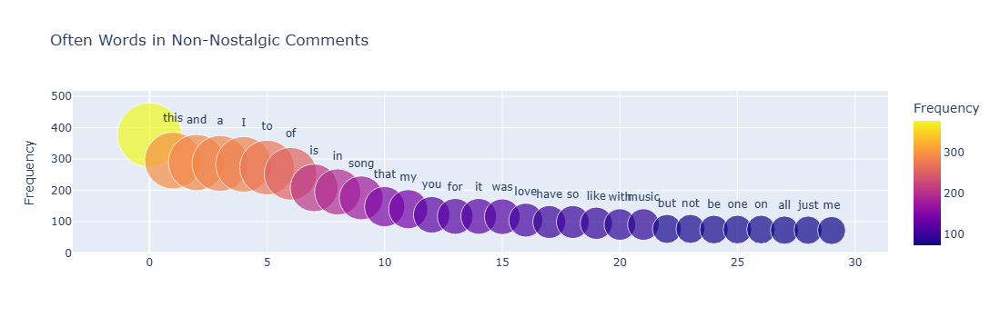

In [456]:
#using plotly
import plotly.express as px
import pandas as pd
from collections import Counter

non_nostalgia_words = [word for sublist in df[df['category'] == 0]['tokenized_text'] for word in sublist]
#helps to count
non_nostalgia_word_counts = Counter(non_nostalgia_words)
common_words = non_nostalgia_word_counts.most_common(30)

#need to transform
words, frequencies = zip(*common_words)

#df
word_df = pd.DataFrame({'Word': words, 'Frequency': frequencies})

#bubble plot with plotly

fig = px.scatter(word_df, x=word_df.index, y='Frequency', size='Frequency', text='Word', 
                 hover_name='Word', size_max=50, color='Frequency',
                 title='Often Words in Non-Nostalgic Comments')

fig.update_traces(textposition='top center')
fig.update_layout(xaxis_title='', yaxis_title='Frequency', showlegend=False)
fig.show()

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\JennisH\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


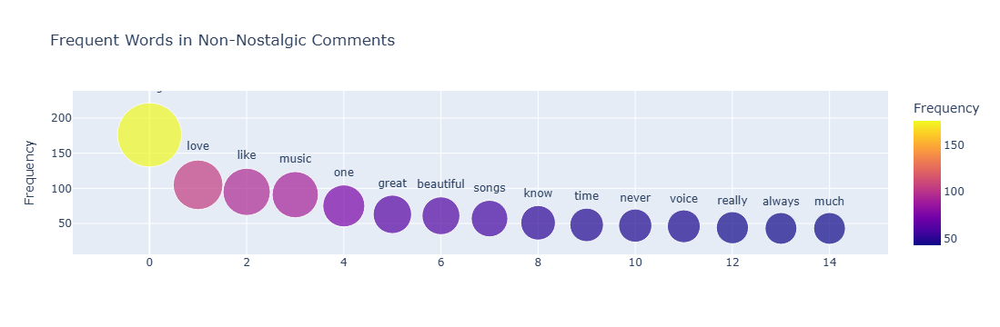

In [461]:
# too many stopwords
#trying to remove
nltk.download('stopwords')
import plotly.express as px
import pandas as pd
import nltk.corpus
from collections import Counter
from nltk.corpus import stopwords

#find stopwords
stop_words = set(stopwords.words('english'))

# Filter them
non_nostalgia_words = [word for sublist in df[df['category'] == 0]['tokenized_text'] for word in sublist if word.lower() not in stop_words]

non_nostalgia_word_counts = Counter(non_nostalgia_words)
common_words = non_nostalgia_word_counts.most_common(15)
words, frequencies = zip(*common_words)
word_df = pd.DataFrame({'Word': words, 'Frequency': frequencies})

# Bubble plot with Plotly
fig = px.scatter(word_df, x=word_df.index, y='Frequency', size='Frequency', text='Word', 
                 hover_name='Word', size_max=50, color='Frequency',
                 title='Frequent Words in Non-Nostalgic Comments')

fig.update_traces(textposition='top center')
fig.update_layout(xaxis_title='', yaxis_title='Frequency', showlegend=False)
fig.show()


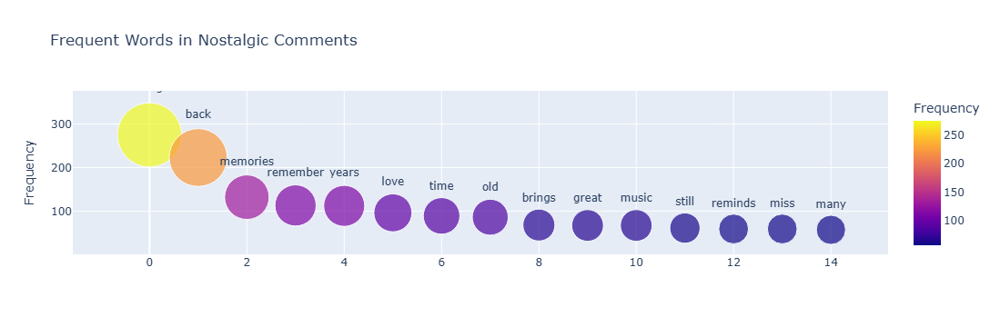

In [462]:
# too many stopwords
#trying to do rhe same for nostalgia words
import plotly.express as px
import pandas as pd
import nltk.corpus
from collections import Counter
from nltk.corpus import stopwords

#find stopwords
stop_words = set(stopwords.words('english'))

# Filter them
nostalgia_words = [word for sublist in df[df['category'] == 1]['tokenized_text'] for word in sublist if word.lower() not in stop_words]

nostalgia_word_counts = Counter(nostalgia_words)
common_words = nostalgia_word_counts.most_common(15)
words, frequencies = zip(*common_words)
word_df = pd.DataFrame({'Word': words, 'Frequency': frequencies})

# Bubble plot with Plotly
fig = px.scatter(word_df, x=word_df.index, y='Frequency', size='Frequency', text='Word', 
                 hover_name='Word', size_max=50, color='Frequency',
                 title='Frequent Words in Nostalgic Comments')

fig.update_traces(textposition='top center')
fig.update_layout(xaxis_title='', yaxis_title='Frequency', showlegend=False)
fig.show()


In [428]:
#generate TD-IDF features

from sklearn.feature_extraction.text import TfidfVectorizer
#removing the stop words that are met in English language
tfidf = TfidfVectorizer(max_features=1500, stop_words='english')  
tfidf_matrix = tfidf.fit_transform(df['comment'])  
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf.get_feature_names_out())
print(tfidf_df.head(20))

    000   07   10       100   11   12   13   14   15  150  ...     years  yeh  \
0   0.0  0.0  0.0  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  ...  0.000000  0.0   
1   0.0  0.0  0.0  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  ...  0.000000  0.0   
2   0.0  0.0  0.0  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  ...  0.000000  0.0   
3   0.0  0.0  0.0  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  ...  0.077764  0.0   
4   0.0  0.0  0.0  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  ...  0.000000  0.0   
5   0.0  0.0  0.0  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  ...  0.000000  0.0   
6   0.0  0.0  0.0  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  ...  0.000000  0.0   
7   0.0  0.0  0.0  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  ...  0.000000  0.0   
8   0.0  0.0  0.0  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  ...  0.000000  0.0   
9   0.0  0.0  0.0  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  ...  0.000000  0.0   
10  0.0  0.0  0.0  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  ...  0.000000  0.0   
11  0.0  0.0  0.0  0.000000 

In [441]:
#change to simple Naive Bayes - Gaussian NB

import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report, accuracy_score

X_train1, X_test1, y_train, y_test = train_test_split(df['comment'], df['category'], test_size=0.15, random_state=42)
tfidf = TfidfVectorizer(max_features=1500, stop_words='english')
X_train = tfidf.fit_transform(X_train1)
# data transformation
X_test = tfidf.transform(X_test1)

In [442]:
# need extra tranformation
X_train_dense = X_train.toarray()
X_test_dense = X_test.toarray()

#need to initialize before fitting
gnb = GaussianNB()

gnb.fit(X_train_dense, y_train)

GaussianNB()

In [443]:
y_pred = gnb.predict(X_test_dense)

accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=['Not Nostalgia', 'Nostalgia']))

Accuracy: 0.67

Classification Report:
                precision    recall  f1-score   support

Not Nostalgia       0.81      0.46      0.58       114
    Nostalgia       0.61      0.89      0.73       111

     accuracy                           0.67       225
    macro avg       0.71      0.67      0.66       225
 weighted avg       0.72      0.67      0.66       225



## The fourth part of homework 

### data processing improvement workflow
#### to start with after loading the data, I will do a quick exploration, to see how it looks like
#### the next step should be data cleaning, removing all missing values, duplicates, anomalies
#### more data pre-processing, at this point we could try to generate more meaningful variables, such as if email had .edu extension, belongs to university and include it for analysis and etc
#### then, I would run different distribution visualizations to get more data insights, from simple to PCAs level
#### then, I would generate all of the features for classification in the same place
#### then, do classification

#### Thanks to Prof and TAs for this homework experience